<a href="https://colab.research.google.com/github/Vineeth8927/Image-crack-detection-and-segmentation/blob/main/crack_500_11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Dataset summary for traincrop:
  Total images: 1896
  Total masks: 1896
  Examples of image names: ['20160326_162529_1921_361.jpg', '20160321_185534_641_1.jpg', '20160405_171410_641_361.jpg', '20160222_165909_1281_1081.jpg', '20160328_153536_1921_721.jpg']
  Examples of mask names: ['20160328_153706_641_721.png', '20160402_150938_1_1.png', '20160328_153732_1281_361.png', '20160405_171723_641_721.png', '20160328_151429_1921_1.png']

Dataset summary for valcrop:
  Total images: 348
  Total masks: 348
  Examples of image names: ['20160321_183947_1921_721.jpg', '20160321_183947_1281_721.jpg', 'IMG_2942_1_485.jpg', '20160324_170347_641_361.jpg', '20160222_165926_1921_721.jpg']
  Examples of mask names: ['20160328_151020_1281_361.png', '20160316_143547_1281_721.png', '20160222_080850_1281_721.png', '20160321_185557_1_721.png', '20160307_145059_1921_721.png']

Dataset summary for testcrop:
  Total images: 1124
  Total masks: 1124
  Examples of image names: ['20160306_103816_641_361.jpg', '201

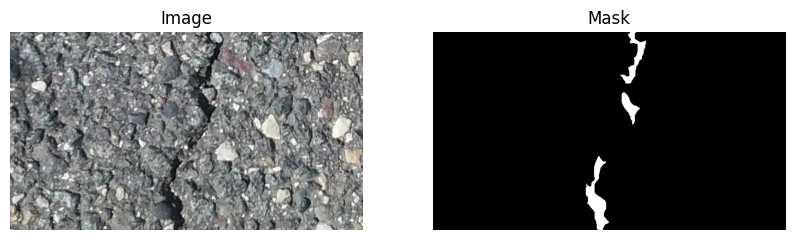

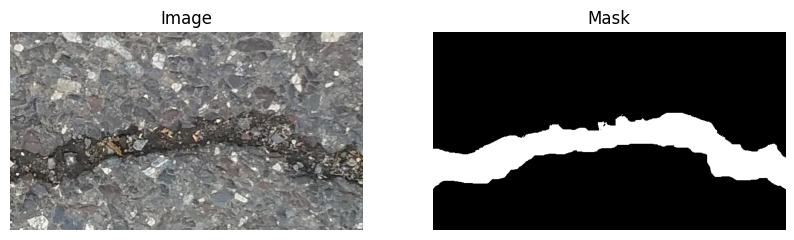

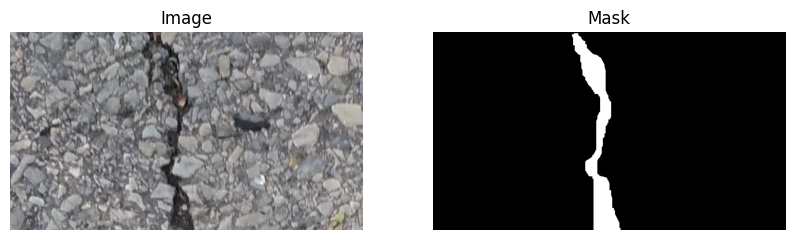

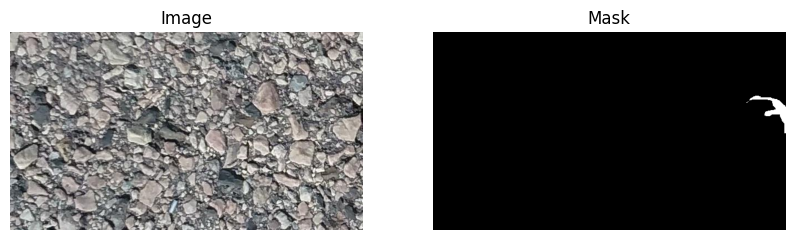

In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define dataset paths
train_path = "/kaggle/input/crack50020220509t090436z001/CRACK500/traincrop/traincrop"
val_path = "/kaggle/input/crack50020220509t090436z001/CRACK500/valcrop/valcrop"
test_path = "/kaggle/input/crack50020220509t090436z001/CRACK500/testcrop/testcrop"

# Function to load and display an image and its mask
def display_image_and_mask(image_path, mask_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Image")
    axes[0].axis('off')

    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title("Mask")
    axes[1].axis('off')

    plt.show()

# Load dataset summary
def dataset_summary(path):
    images = [f for f in os.listdir(path) if f.endswith('.jpg')]
    masks = [f for f in os.listdir(path) if f.endswith('.png')]
    print(f"Dataset summary for {path.split('/')[-1]}:")
    print(f"  Total images: {len(images)}")
    print(f"  Total masks: {len(masks)}")
    print(f"  Examples of image names: {images[:5]}")
    print(f"  Examples of mask names: {masks[:5]}\n")

# Display summary for each split
dataset_summary(train_path)
dataset_summary(val_path)
dataset_summary(test_path)

# Display 5 random images and masks from the validation set
random_images = random.sample(os.listdir(val_path), 5)
for img_name in random_images:
    if img_name.endswith('.jpg'):
        image_path = os.path.join(val_path, img_name)
        mask_path = os.path.join(val_path, img_name.replace('.jpg', '.png'))
        display_image_and_mask(image_path, mask_path)


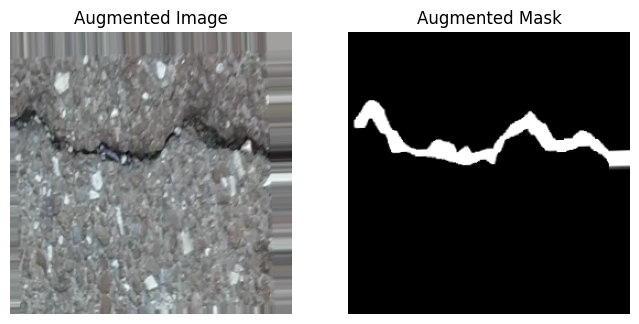

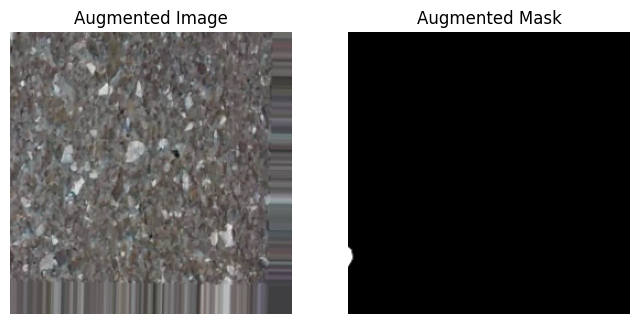

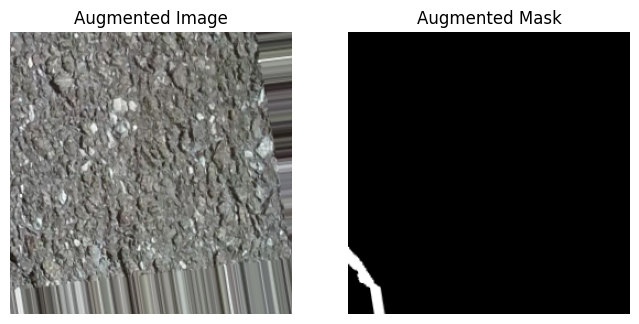

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Constants
IMG_HEIGHT, IMG_WIDTH = 256, 256  # Resize dimensions
BATCH_SIZE = 16  # Batch size for training

# Data Augmentation Configuration
data_gen_args = dict(rotation_range=10,
                     width_shift_range=0.1,
                     height_shift_range=0.1,
                     shear_range=0.1,
                     zoom_range=0.1,
                     horizontal_flip=True,
                     fill_mode='nearest')

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

# Helper function to load and preprocess an image and mask
def preprocess_image_and_mask(image_path, mask_path):
    # Load image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))
    image = cv2.normalize(image, None, 0, 1, cv2.NORM_MINMAX, dtype=cv2.CV_32F)

    # Load mask
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))
    mask = np.expand_dims(mask, axis=-1) / 255.0  # Normalize to [0, 1] and add channel dimension

    return image, mask

# Generator function to load and augment images and masks in batches
def data_generator(image_paths, mask_paths, batch_size, augment=False):
    while True:
        idx = np.random.permutation(len(image_paths))
        batch_images, batch_masks = [], []

        for i in idx:
            img, mask = preprocess_image_and_mask(image_paths[i], mask_paths[i])
            if augment:
                seed = np.random.randint(0, 10000)
                img = image_datagen.random_transform(img, seed=seed)
                mask = mask_datagen.random_transform(mask, seed=seed)

            batch_images.append(img)
            batch_masks.append(mask)

            # Yield batch when full
            if len(batch_images) == batch_size:
                yield np.array(batch_images), np.array(batch_masks)
                batch_images, batch_masks = [], []

# Load dataset paths
def load_dataset_paths(path):
    images = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.jpg')])
    masks = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.png')])
    return images, masks

# Paths for training, validation, and testing data
train_images, train_masks = load_dataset_paths(train_path)
val_images, val_masks = load_dataset_paths(val_path)
test_images, test_masks = load_dataset_paths(test_path)

# Creating the data generators for training and validation
train_gen = data_generator(train_images, train_masks, BATCH_SIZE, augment=True)
val_gen = data_generator(val_images, val_masks, BATCH_SIZE, augment=False)
test_gen = data_generator(test_images, test_masks, BATCH_SIZE, augment=False)

# Display a sample batch to verify preprocessing
sample_images, sample_masks = next(train_gen)
for i in range(3):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
    ax1.imshow(sample_images[i])
    ax1.set_title("Augmented Image")
    ax1.axis("off")

    ax2.imshow(sample_masks[i].squeeze(), cmap="gray")
    ax2.set_title("Augmented Mask")
    ax2.axis("off")
    plt.show()


Epoch 1/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 91s 558ms/step - accuracy: 0.8961 - loss: 0.3738 - mean_io_u: 0.4722 - val_accuracy: 0.9374 - val_loss: 0.1677 - val_mean_io_u: 0.4716
Epoch 2/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 60s 513ms/step - accuracy: 0.9329 - loss: 0.1496 - mean_io_u: 0.4721 - val_accuracy: 0.9533 - val_loss: 0.1191 - val_mean_io_u: 0.4720
Epoch 3/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 59s 504ms/step - accuracy: 0.9458 - loss: 0.1259 - mean_io_u: 0.4715 - val_accuracy: 0.9638 - val_loss: 0.0896 - val_mean_io_u: 0.4736
Epoch 4/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 59s 500ms/step - accuracy: 0.9500 - loss: 0.1143 - mean_io_u: 0.4731 - val_accuracy: 0.9662 - val_loss: 0.0797 - val_mean_io_u: 0.4719
Epoch 5/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 59s 503ms/step - accuracy: 0.9531 - loss: 0.1025 - mean_io_u: 0.4728 - val_accuracy: 0.9608 - val_loss: 0.0940 - val_mean_io_u: 0.4730
Epoch 6/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 61s 515ms/step - accuracy: 0.9515 - loss: 0.1089 - mean_io_u: 0.4721 - val_accuracy: 

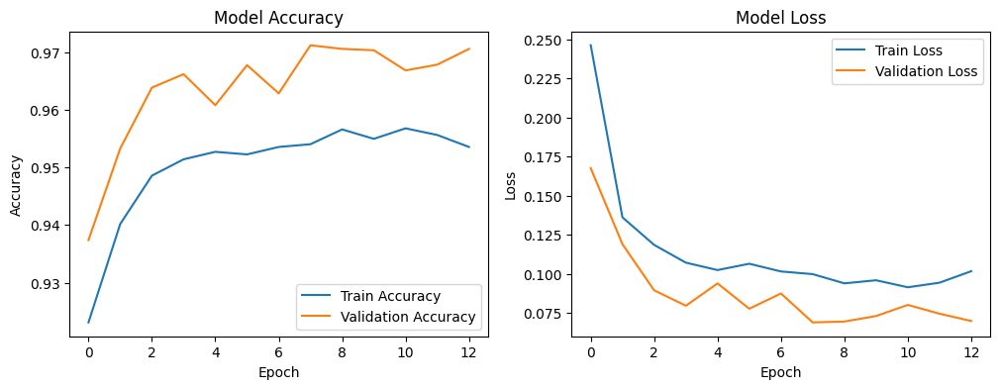

70/70 ━━━━━━━━━━━━━━━━━━━━ 20s 282ms/step - accuracy: 0.9613 - loss: 0.0946 - mean_io_u: 0.4742
Test Loss: 0.0910
Test Accuracy: 0.9621
Test Mean IoU: 0.4744
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


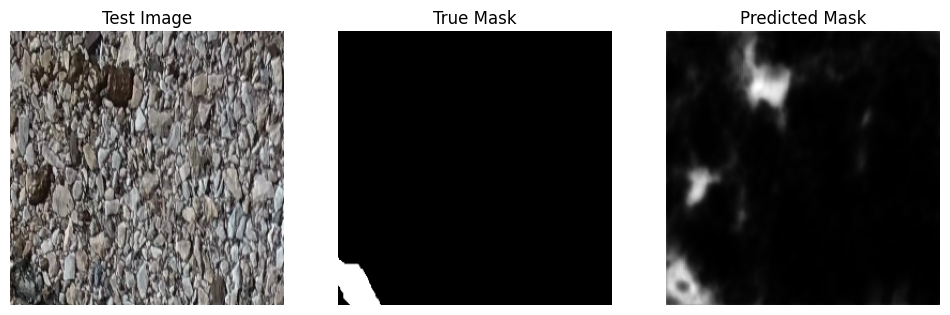

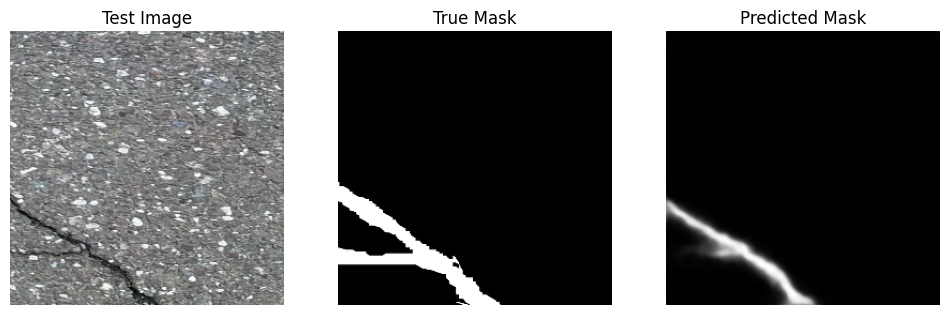

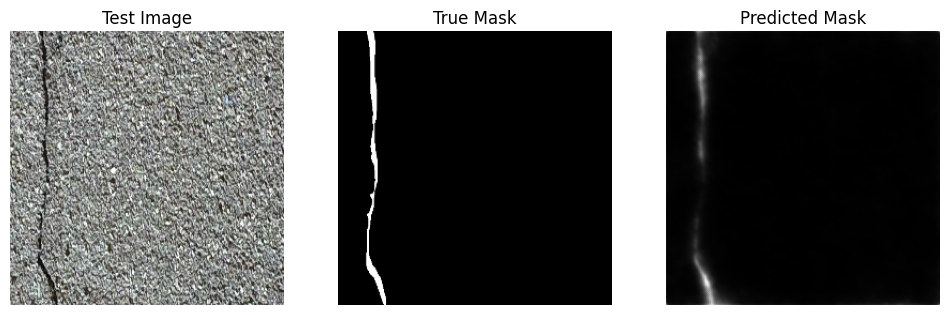

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, optimizers
import matplotlib.pyplot as plt

# Strategy for multi-GPU training
strategy = tf.distribute.MirroredStrategy()

# Constants
EPOCHS = 25
LEARNING_RATE = 1e-4

# Define the CNN model within the strategy scope
with strategy.scope():
    # U-Net inspired CNN model for segmentation
    def build_unet_model(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)):
        inputs = layers.Input(shape=input_shape)

        # Encoder
        c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
        c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
        p1 = layers.MaxPooling2D((2, 2))(c1)

        c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
        c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
        p2 = layers.MaxPooling2D((2, 2))(c2)

        c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
        c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
        p3 = layers.MaxPooling2D((2, 2))(c3)

        # Bottleneck
        c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
        c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)

        # Decoder
        u5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c4)
        u5 = layers.concatenate([u5, c3])
        c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u5)
        c5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c5)

        u6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
        u6 = layers.concatenate([u6, c2])
        c6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u6)
        c6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c6)

        u7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
        u7 = layers.concatenate([u7, c1])
        c7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u7)
        c7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c7)

        outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c7)

        model = models.Model(inputs=[inputs], outputs=[outputs])
        return model

    # Instantiate the model
    model = build_unet_model()

    # Compile the model
    model.compile(optimizer=optimizers.Adam(learning_rate=LEARNING_RATE),
                  loss='binary_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.MeanIoU(num_classes=2)])

# Callbacks for training
checkpoint_cb = callbacks.ModelCheckpoint("road_crack_segmentation_model.keras", save_best_only=True)
early_stopping_cb = callbacks.EarlyStopping(patience=5, restore_best_weights=True)


# Training the model
history = model.fit(train_gen,
                    steps_per_epoch=len(train_images) // BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=val_gen,
                    validation_steps=len(val_images) // BATCH_SIZE,
                    callbacks=[checkpoint_cb, early_stopping_cb])

# Plotting training and validation metrics
def plot_history(history):
    # Plot training & validation accuracy values
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot training & validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_history(history)

# Model evaluation on the test set
test_loss, test_accuracy, test_miou = model.evaluate(test_gen, steps=len(test_images) // BATCH_SIZE)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Mean IoU: {test_miou:.4f}")

# Visualizing predictions on test images
def display_predictions(generator, num_images=3):
    images, masks = next(generator)
    predictions = model.predict(images)

    for i in range(num_images):
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
        ax1.imshow(images[i])
        ax1.set_title("Test Image")
        ax1.axis("off")

        ax2.imshow(masks[i].squeeze(), cmap="gray")
        ax2.set_title("True Mask")
        ax2.axis("off")

        ax3.imshow(predictions[i].squeeze(), cmap="gray")
        ax3.set_title("Predicted Mask")
        ax3.axis("off")

        plt.show()

display_predictions(test_gen)


Number of devices: 2
Training images: 1896
Validation images: 348
Test images: 1124

Creating and compiling model...


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        256 │ conv2d_15[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 256, 256,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 128, 128,  │          0 │ conv2d_16[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_3[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 128, 128,  │          0 │ max_pooling2d_3[… │
│ (Concatenate)       │ 192)              │            │ conv2d_17[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 128, 128,  │    221,312 │ concatenate_3[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 128, 128,  │          0 │ max_pooling2d_3[… │
│ (Concatenate)       │ 320)              │            │ conv2d_17[0][0],  │
│                     │                   │            │ conv2d_18[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 128, 128,  │    368,768 │ concatenate_4[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 64, 64,    │          0 │ conv2d_19[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_4[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 64, 64,    │          0 │ max_pooling2d_4[… │
│ (Concatenate)       │ 384)              │            │ conv2d_20[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 64, 64,    │    884,992 │ concatenate_5[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 64, 64,    │          0 │ max_pooling2d_4[… │
│ (Concatenate)       │ 640)              │            │ conv2d_20[0][0],  │
│                     │                   │            │ conv2d_21[0][0] 

 Total params: 58,907,081 (224.71 MB)

 Trainable params: 58,906,953 (224.71 MB)

 Non-trainable params: 128 (512.00 B)


Starting training...
Epoch 1/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 122s 662ms/step - loss: 1.4069 - main_output_accuracy: 0.8161 - main_output_mean_iou: 0.4766 - val_loss: 1.5759 - val_main_output_accuracy: 0.9339 - val_main_output_mean_iou: 0.4700 - learning_rate: 1.0000e-04
Epoch 2/25
  1/118 ━━━━━━━━━━━━━━━━━━━━ 20:02 10s/step - loss: 1.0063 - main_output_accuracy: 0.9677 - main_output_mean_iou: 0.4840

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


118/118 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 1.0484 - main_output_accuracy: 0.9689 - main_output_mean_iou: 0.4843 - val_loss: 1.2119 - val_main_output_accuracy: 0.9718 - val_main_output_mean_iou: 0.4877 - learning_rate: 1.0000e-04
Epoch 3/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 73s 621ms/step - loss: 1.1542 - main_output_accuracy: 0.9251 - main_output_mean_iou: 0.4766 - val_loss: 1.4036 - val_main_output_accuracy: 0.9339 - val_main_output_mean_iou: 0.4700 - learning_rate: 1.0000e-04
Epoch 4/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.9495 - main_output_accuracy: 0.9711 - main_output_mean_iou: 0.4843 - val_loss: 1.0370 - val_main_output_accuracy: 0.9720 - val_main_output_mean_iou: 0.4877 - learning_rate: 1.0000e-04
Epoch 5/25
118/118 ━━━━━━━━━━━━━━━━━━━━ 74s 621ms/step - loss: 1.0525 - main_output_accuracy: 0.9448 - main_output_mean_iou: 0.4766 - val_loss: 1.1993 - val_main_output_accuracy: 0.9338 - val_main_output_mean_iou: 0.4700 - learning_rate: 1.0000e-04
Epoch 6/25
118/118

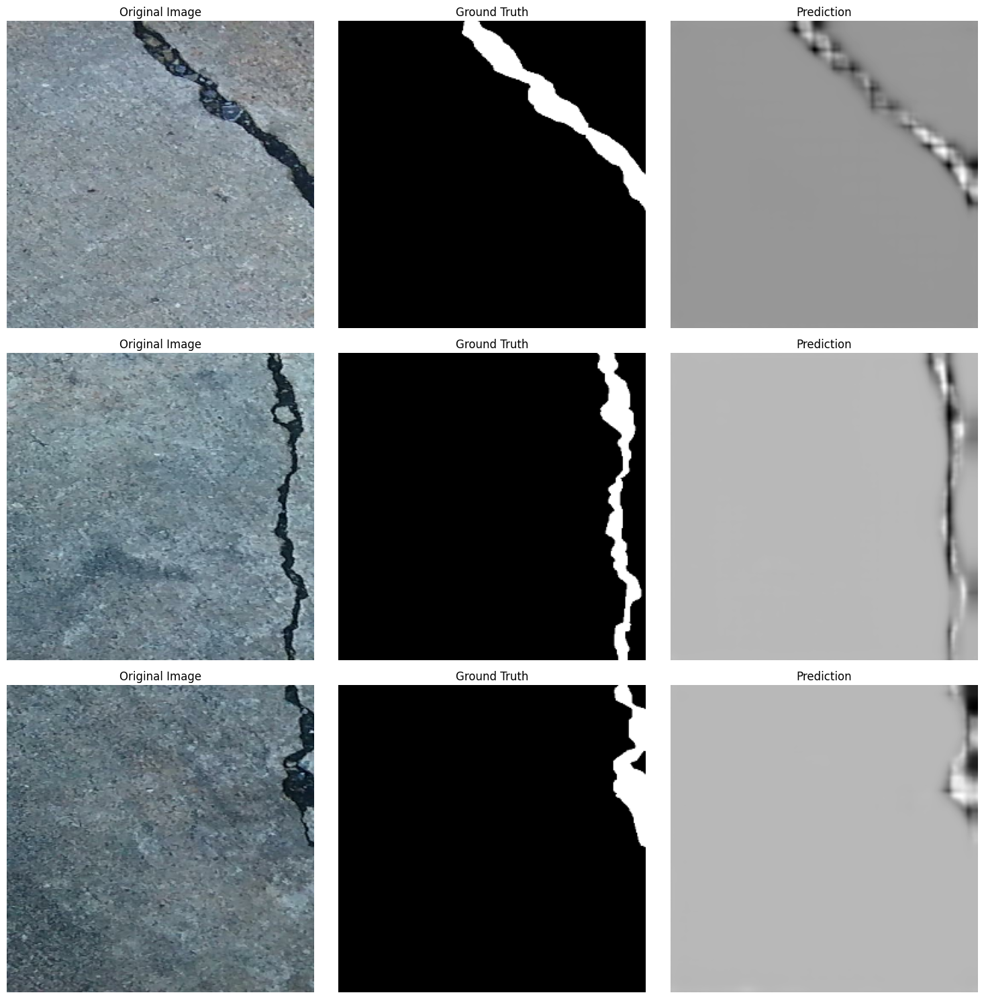


Plotting training history...


KeyError: 'side_output_level1_loss'

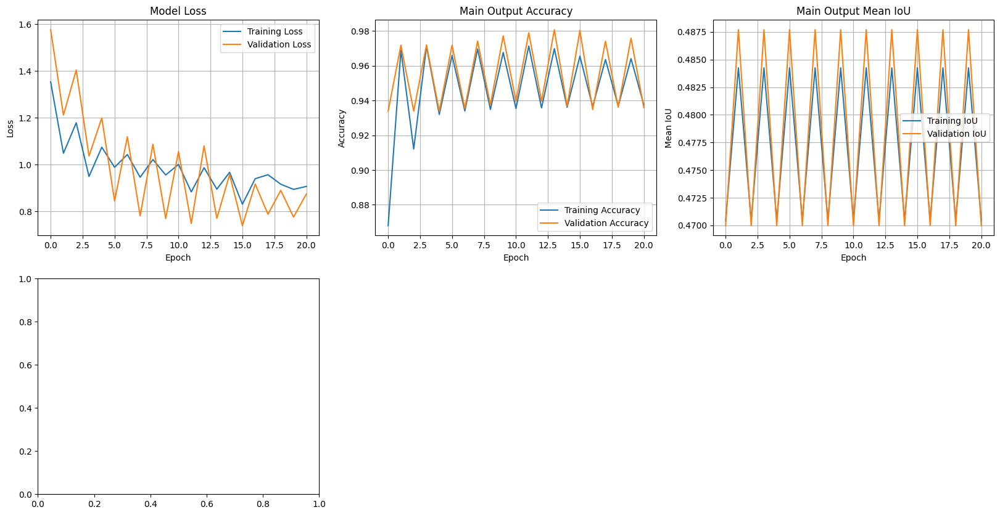

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, optimizers
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import json

# Constants
IMG_HEIGHT, IMG_WIDTH = 256, 256
BATCH_SIZE = 16
EPOCHS = 25
LEARNING_RATE = 1e-4
INPUT_SHAPE = (IMG_HEIGHT, IMG_WIDTH, 3)

# Data paths
TRAIN_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/traincrop/traincrop"
VAL_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/valcrop/valcrop"
TEST_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/testcrop/testcrop"

# Strategy for multi-GPU training
strategy = tf.distribute.MirroredStrategy()
print('Number of devices:', strategy.num_replicas_in_sync)

def load_dataset_paths(path):
    """Load image and mask paths from directory"""
    images = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.jpg')])
    masks = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.png')])
    return images, masks

def process_data_for_training(image_path, mask_path):
    """Process single image and mask for training"""
    # Read image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])

    # Read mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.cast(mask, tf.float32) / 255.0
    mask = tf.image.resize(mask, [IMG_HEIGHT, IMG_WIDTH])

    # Return multiple copies of mask for all outputs
    return image, mask

def augment_data(image, mask):
    """Apply data augmentation"""
    # Random flip left/right
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)

    # Random flip up/down
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)

    # Random brightness (only for image)
    image = tf.image.random_brightness(image, 0.1)
    image = tf.clip_by_value(image, 0, 1)

    return image, mask

def create_dataset(image_paths, mask_paths, batch_size, augment=False):
    """Create tf.data.Dataset"""
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(process_data_for_training,
                         num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        dataset = dataset.map(augment_data,
                            num_parallel_calls=tf.data.AUTOTUNE)

    # Prepare the data for multi-output model
    dataset = dataset.map(
        lambda x, y: (x, (y, y, y, y, y)),
        num_parallel_calls=tf.data.AUTOTUNE
    )

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

def hierarchical_supervised_loss(y_true, y_pred):
    """Custom loss function for hierarchical supervision"""
    # Convert inputs to float32
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    # Calculate main output loss
    main_loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    main_loss = tf.reduce_mean(main_loss)

    return main_loss

def create_fphbn_model(input_shape=INPUT_SHAPE):
    """Create the Feature Pyramid Hierarchical Boosting Network"""
    inputs = layers.Input(shape=input_shape)

    # Initial convolution block
    x = layers.Conv2D(64, 3, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    conv1 = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    def dense_block(x, filters):
        x1 = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
        x2 = layers.Conv2D(filters, 3, padding='same', activation='relu')(
            layers.concatenate([x, x1]))
        x3 = layers.Conv2D(filters, 3, padding='same', activation='relu')(
            layers.concatenate([x, x1, x2]))
        return x3

    # Feature Pyramid with dense connections
    db1 = dense_block(pool1, 128)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(db1)

    db2 = dense_block(pool2, 256)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(db2)

    db3 = dense_block(pool3, 512)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(db3)

    db4 = dense_block(pool4, 1024)

    def pyramid_fusion(high_feat, low_feat, filters):
        high_up = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(high_feat)
        low_1x1 = layers.Conv2D(filters, 1, padding='same')(low_feat)
        return layers.Add()([high_up, low_1x1])

    # Pyramid levels
    p4 = layers.Conv2D(256, 1, padding='same')(db4)
    p3 = pyramid_fusion(p4, db3, 256)
    p2 = pyramid_fusion(p3, db2, 256)
    p1 = pyramid_fusion(p2, db1, 256)

    def side_branch(x, level):
        """Create side branch with unique names"""
        name_prefix = f'side_{level}'
        x = layers.Conv2D(128, 3, padding='same', activation='relu',
                         name=f'{name_prefix}_conv1')(x)
        x = layers.Conv2D(1, 1, padding='same',
                         name=f'{name_prefix}_conv2')(x)
        if x.shape[1:3] != (IMG_HEIGHT, IMG_WIDTH):
            x = layers.Lambda(lambda img: tf.image.resize(img, (IMG_HEIGHT, IMG_WIDTH)),
                            name=f'{name_prefix}_upsample')(x)
        x = layers.Activation('sigmoid', name=f'side_output_{level}')(x)
        return x

    # Side outputs with unique names
    side1 = side_branch(p1, 'level1')
    side2 = side_branch(p2, 'level2')
    side3 = side_branch(p3, 'level3')
    side4 = side_branch(p4, 'level4')

    # Fusion layer
    fused = layers.concatenate([side1, side2, side3, side4], name='fusion')
    main_output = layers.Conv2D(1, 1, padding='same', activation='sigmoid',
                               name='main_output')(fused)

    model = models.Model(
        inputs=[inputs],
        outputs=[main_output, side1, side2, side3, side4]
    )

    return model

def display_results(model, test_dataset, num_samples=3):
    """Display test results"""
    for images, labels in test_dataset.take(1):
        predictions = model.predict(images)
        main_predictions = predictions[0]

        fig = plt.figure(figsize=(15, 5*num_samples))
        for idx in range(min(num_samples, len(images))):
            # Original Image
            plt.subplot(num_samples, 3, idx*3 + 1)
            plt.imshow(images[idx])
            plt.title('Original Image')
            plt.axis('off')

            # Ground Truth
            plt.subplot(num_samples, 3, idx*3 + 2)
            plt.imshow(labels[0][idx, ..., 0], cmap='gray')
            plt.title('Ground Truth')
            plt.axis('off')

            # Prediction
            plt.subplot(num_samples, 3, idx*3 + 3)
            plt.imshow(main_predictions[idx, ..., 0], cmap='gray')
            plt.title('Prediction')
            plt.axis('off')

        plt.tight_layout()
        plt.show()

def plot_training_history(history):
    """Plot training curves for all metrics and losses"""
    # Create a larger figure
    plt.figure(figsize=(20, 10))

    # Plot main loss
    plt.subplot(2, 3, 1)
    plt.plot(history['loss'], label='Training Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot main output metrics
    plt.subplot(2, 3, 2)
    plt.plot(history['main_output_accuracy'], label='Training Accuracy')
    plt.plot(history['val_main_output_accuracy'], label='Validation Accuracy')
    plt.title('Main Output Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 3, 3)
    plt.plot(history['main_output_mean_iou'], label='Training IoU')
    plt.plot(history['val_main_output_mean_iou'], label='Validation IoU')
    plt.title('Main Output Mean IoU')
    plt.xlabel('Epoch')
    plt.ylabel('Mean IoU')
    plt.legend()
    plt.grid(True)

    # Plot side output losses
    plt.subplot(2, 3, 4)
    for i in range(1, 5):
        plt.plot(history[f'side_output_level{i}_loss'],
                label=f'Side Output {i} Loss')
    plt.title('Side Output Losses')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot learning rate if available
    if 'lr' in history:
        plt.subplot(2, 3, 5)
        plt.plot(history['lr'], label='Learning Rate')
        plt.title('Learning Rate over Time')
        plt.xlabel('Epoch')
        plt.ylabel('Learning Rate')
        plt.legend()
        plt.grid(True)
        plt.yscale('log')

    plt.tight_layout()
    plt.show()

def visualize_side_outputs(model, dataset, num_samples=3):
    """Visualize main and side outputs for sample images"""
    for images, labels in dataset.take(1):
        predictions = model.predict(images)

        for idx in range(min(num_samples, len(images))):
            fig = plt.figure(figsize=(20, 4))

            # Original image
            plt.subplot(1, 7, 1)
            plt.imshow(images[idx])
            plt.title('Original Image')
            plt.axis('off')

            # Ground truth
            plt.subplot(1, 7, 2)
            plt.imshow(labels[0][idx, ..., 0], cmap='gray')
            plt.title('Ground Truth')
            plt.axis('off')

            # Main output and side outputs
            titles = ['Main Output'] + [f'Side Output {i}' for i in range(1, 5)]
            for i, (pred, title) in enumerate(zip(predictions, titles)):
                plt.subplot(1, 7, i + 3)
                plt.imshow(pred[idx, ..., 0], cmap='gray')
                plt.title(title)
                plt.axis('off')

            plt.tight_layout()
            plt.show()

def visualize_prediction_overlay(model, dataset, num_samples=3, threshold=0.5):
    """Visualize predictions overlaid on original images"""
    for images, labels in dataset.take(1):
        predictions = model.predict(images)
        main_predictions = predictions[0]

        for idx in range(min(num_samples, len(images))):
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            # Original image
            axes[0].imshow(images[idx])
            axes[0].set_title('Original Image')
            axes[0].axis('off')

            # Ground truth overlay
            axes[1].imshow(images[idx])
            mask = labels[0][idx, ..., 0] > threshold
            overlay = np.zeros((*mask.shape, 4))
            overlay[mask] = [1, 0, 0, 0.5]  # Red with 0.5 alpha
            axes[1].imshow(overlay)
            axes[1].set_title('Ground Truth Overlay')
            axes[1].axis('off')

            # Prediction overlay
            axes[2].imshow(images[idx])
            pred_mask = main_predictions[idx, ..., 0] > threshold
            pred_overlay = np.zeros((*pred_mask.shape, 4))
            pred_overlay[pred_mask] = [0, 1, 0, 0.5]  # Green with 0.5 alpha
            axes[2].imshow(pred_overlay)
            axes[2].set_title('Prediction Overlay')
            axes[2].axis('off')

            plt.tight_layout()
            plt.show()

# Main execution
if __name__ == "__main__":
    # Load dataset paths
    train_images, train_masks = load_dataset_paths(TRAIN_PATH)
    val_images, val_masks = load_dataset_paths(VAL_PATH)
    test_images, test_masks = load_dataset_paths(TEST_PATH)

    print(f"Training images: {len(train_images)}")
    print(f"Validation images: {len(val_images)}")
    print(f"Test images: {len(test_images)}")

    # Create datasets
    train_dataset = create_dataset(train_images, train_masks, BATCH_SIZE, augment=True)
    val_dataset = create_dataset(val_images, val_masks, BATCH_SIZE)
    test_dataset = create_dataset(test_images, test_masks, BATCH_SIZE)

    # Create and compile model
    print("\nCreating and compiling model...")
    with strategy.scope():
        model = create_fphbn_model()

        # Update loss dictionary with correct output names
        losses = {
            'main_output': hierarchical_supervised_loss,
            'side_output_level1': hierarchical_supervised_loss,
            'side_output_level2': hierarchical_supervised_loss,
            'side_output_level3': hierarchical_supervised_loss,
            'side_output_level4': hierarchical_supervised_loss
        }

        loss_weights = {
            'main_output': 1.0,
            'side_output_level1': 0.5,
            'side_output_level2': 0.75,
            'side_output_level3': 0.875,
            'side_output_level4': 1.0
        }

        metrics = {
            'main_output': [
                tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                tf.keras.metrics.MeanIoU(num_classes=2, name='mean_iou')
            ]
        }

        model.compile(
            optimizer=optimizers.Adam(learning_rate=LEARNING_RATE),
            loss=losses,
            loss_weights=loss_weights,
            metrics=metrics
        )

    # Model summary
    model.summary()

    # Callbacks
    callbacks_list = [
        callbacks.ModelCheckpoint(
            "fphbn_model_best.keras",
            save_best_only=True,
            monitor='val_loss',  # Changed from 'val_main_output_loss'
            mode='min'
        ),
        callbacks.EarlyStopping(
            patience=5,
            restore_best_weights=True,
            monitor='val_loss',  # Changed from 'val_main_output_loss'
            mode='min'
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',  # Changed from 'val_main_output_loss'
            factor=0.5,
            patience=3,
            min_lr=1e-6,
            mode='min'
        ),
        callbacks.TensorBoard(
            log_dir='./logs',
            write_graph=True,
            update_freq='epoch'
        )
    ]

    # Train the model
    print("\nStarting training...")
    history = model.fit(
        train_dataset,
        epochs=EPOCHS,
        validation_data=val_dataset,
        callbacks=callbacks_list,
        validation_steps=len(val_images) // BATCH_SIZE,
        steps_per_epoch=len(train_images) // BATCH_SIZE
    )

    # Save training history
    history_dict = {}
    for key in history.history:
        history_dict[key] = [float(val) for val in history.history[key]]

    with open('fphbn_training_history.json', 'w') as f:
        json.dump(history_dict, f, indent=4)

    print("\nSaved training history to 'fphbn_training_history.json'")

    # Evaluate model
    print("\nEvaluating model on test set...")
    test_results = model.evaluate(test_dataset)

    # Print test results
    metric_names = ['Loss'] + [m.name for m in model.metrics]
    for name, value in zip(metric_names, test_results):
        print(f"Test {name}: {value:.4f}")

    # Display some test results
    print("\nGenerating visualization of results...")
    display_results(model, test_dataset)

# Plot training history
    print("\nPlotting training history...")
    plot_training_history(history.history)

    # Save training history
    history_dict = {}
    for key in history.history:
        history_dict[key] = [float(val) for val in history.history[key]]

    with open('fphbn_training_history.json', 'w') as f:
        json.dump(history_dict, f, indent=4)

    print("\nSaved training history to 'fphbn_training_history.json'")

    # Evaluate model
    print("\nEvaluating model on test set...")
    test_results = model.evaluate(test_dataset)

    # Print test results
    metric_names = ['Loss'] + [m.name for m in model.metrics]
    for name, value in zip(metric_names, test_results):
        print(f"Test {name}: {value:.4f}")

    # Generate visualizations
    print("\nGenerating visualization of results...")
    print("\n1. Basic Prediction Comparison")
    display_results(model, test_dataset)

    print("\n2. Side Output Visualization")
    visualize_side_outputs(model, test_dataset)

    print("\n3. Prediction Overlays")
    visualize_prediction_overlay(model, test_dataset)

    # Save a summary figure
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 2)
    plt.plot(history.history['main_output_accuracy'], label='Training Acc')
    plt.plot(history.history['val_main_output_accuracy'], label='Validation Acc')
    plt.title('Model Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(history.history['main_output_mean_iou'], label='Training IoU')
    plt.plot(history.history['val_main_output_mean_iou'], label='Validation IoU')
    plt.title('Model IoU')
    plt.legend()
    plt.grid(True)

    if 'lr' in history.history:
        plt.subplot(2, 2, 4)
        plt.plot(history.history['lr'])
        plt.title('Learning Rate')
        plt.yscale('log')
        plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_summary.png', bbox_inches='tight', dpi=300)
    plt.close()

Number of devices: 2
Training images: 1896
Validation images: 348
Test images: 1124

Creating and compiling model...


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_33 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_33[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_34 (Conv2D)  │ (None, 256, 256,  │     36,928 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 128, 128,  │          0 │ conv2d_34[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_35 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_7[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_11      │ (None, 128, 128,  │          0 │ max_pooling2d_7[… │
│ (Concatenate)       │ 192)              │            │ conv2d_35[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_36 (Conv2D)  │ (None, 128, 128,  │    221,312 │ concatenate_11[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_12      │ (None, 128, 128,  │          0 │ max_pooling2d_7[… │
│ (Concatenate)       │ 320)              │            │ conv2d_35[0][0],  │
│                     │                   │            │ conv2d_36[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_37 (Conv2D)  │ (None, 128, 128,  │    368,768 │ concatenate_12[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 64, 64,    │          0 │ conv2d_37[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_8[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_13      │ (None, 64, 64,    │          0 │ max_pooling2d_8[… │
│ (Concatenate)       │ 384)              │            │ conv2d_38[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 64, 64,    │    884,992 │ concatenate_13[0… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 64, 64,    │          0 │ max_pooling2d_8[… │
│ (Concatenate)       │ 640)              │            │ conv2d_38[0][0],  │
│                     │                   │            │ conv2d_39[0][0] 

 Total params: 59,204,421 (225.85 MB)

 Trainable params: 59,204,293 (225.85 MB)

 Non-trainable params: 128 (512.00 B)


Starting training...
Epoch 1/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 123s 710ms/step - loss: 1.4328 - main_output_accuracy: 0.9463 - main_output_mean_iou: 0.4766 - side_output_level1_mean_iou: 0.4766 - side_output_level2_mean_iou: 0.4766 - side_output_level3_mean_iou: 0.4766 - side_output_level4_mean_iou: 0.4766 - val_loss: 1.6565 - val_main_output_accuracy: 0.9338 - val_main_output_mean_iou: 0.4700 - val_side_output_level1_mean_iou: 0.4700 - val_side_output_level2_mean_iou: 0.4700 - val_side_output_level3_mean_iou: 0.4700 - val_side_output_level4_mean_iou: 0.4700 - learning_rate: 1.0000e-04
Epoch 2/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.9796 - main_output_accuracy: 0.9634 - main_output_mean_iou: 0.4843 - side_output_level1_mean_iou: 0.4843 - side_output_level2_mean_iou: 0.4843 - side_output_level3_mean_iou: 0.4843 - side_output_level4_mean_iou: 0.4843 - val_loss: 1.3284 - val_main_output_accuracy: 0.9717 - val_main_output_mean_iou: 0.4877 - val_side_output_level1_mean_iou: 0.

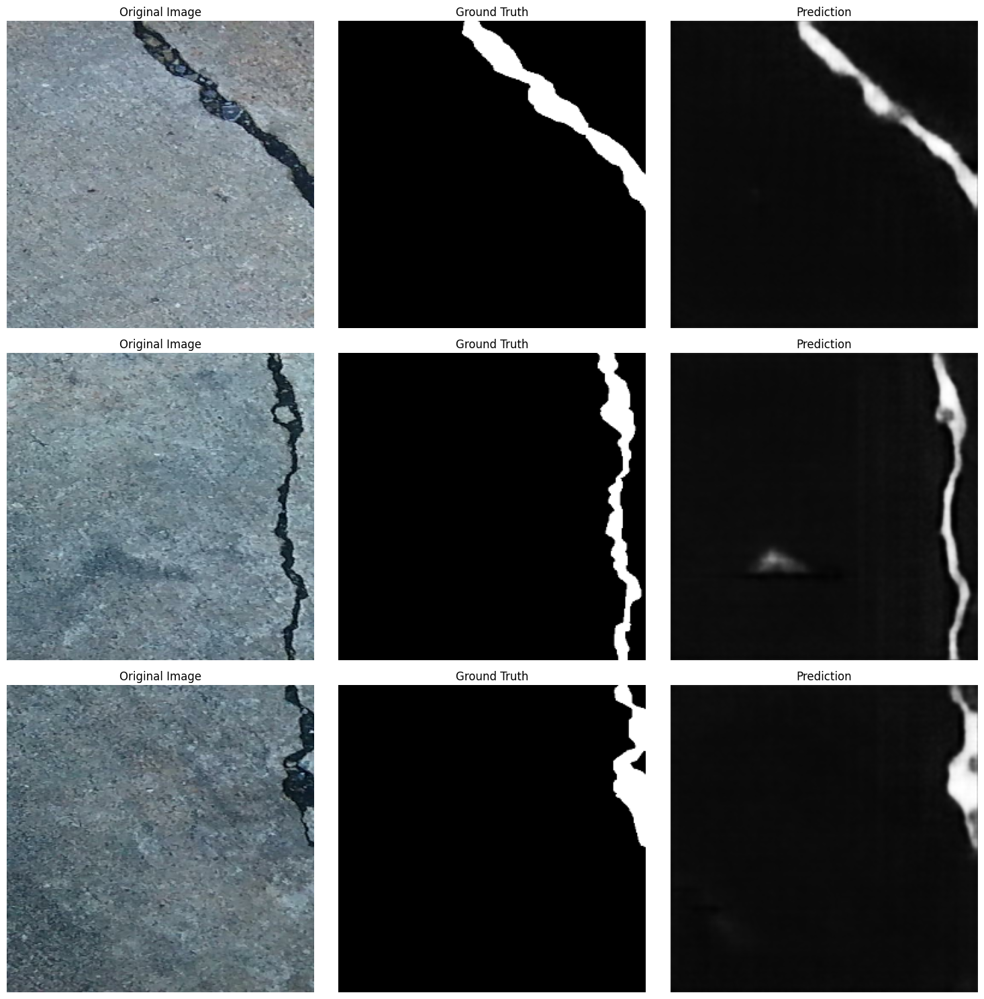


Plotting training history...


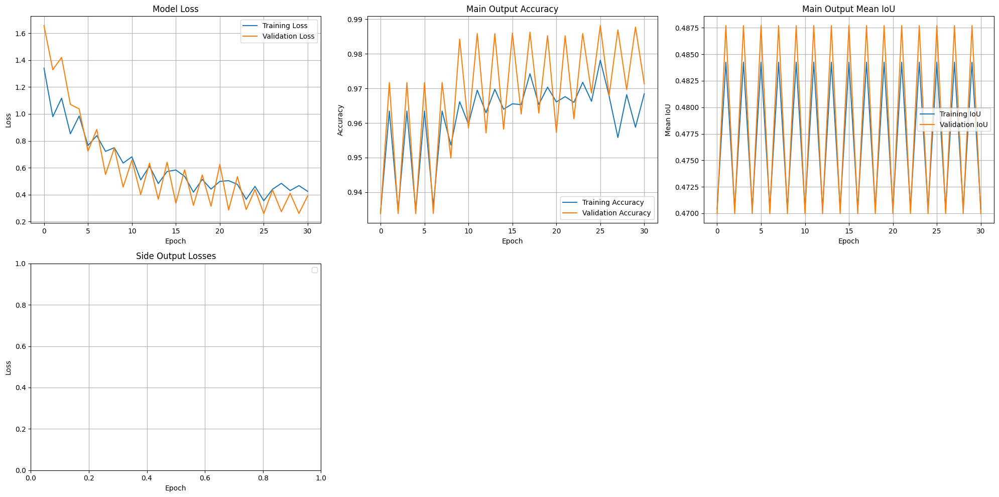


Saved training history to 'fphbn_training_history.json'

Evaluating model on test set...
71/71 ━━━━━━━━━━━━━━━━━━━━ 24s 332ms/step - loss: 0.4987 - main_output_accuracy: 0.9625 - main_output_mean_iou: 0.4769 - side_output_level1_mean_iou: 0.4769 - side_output_level2_mean_iou: 0.4769 - side_output_level3_mean_iou: 0.4769 - side_output_level4_mean_iou: 0.4769
Test Loss: 0.5009
Test loss: 0.9628
Test compile_metrics: 0.4739

Generating visualization of results...

1. Basic Prediction Comparison
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


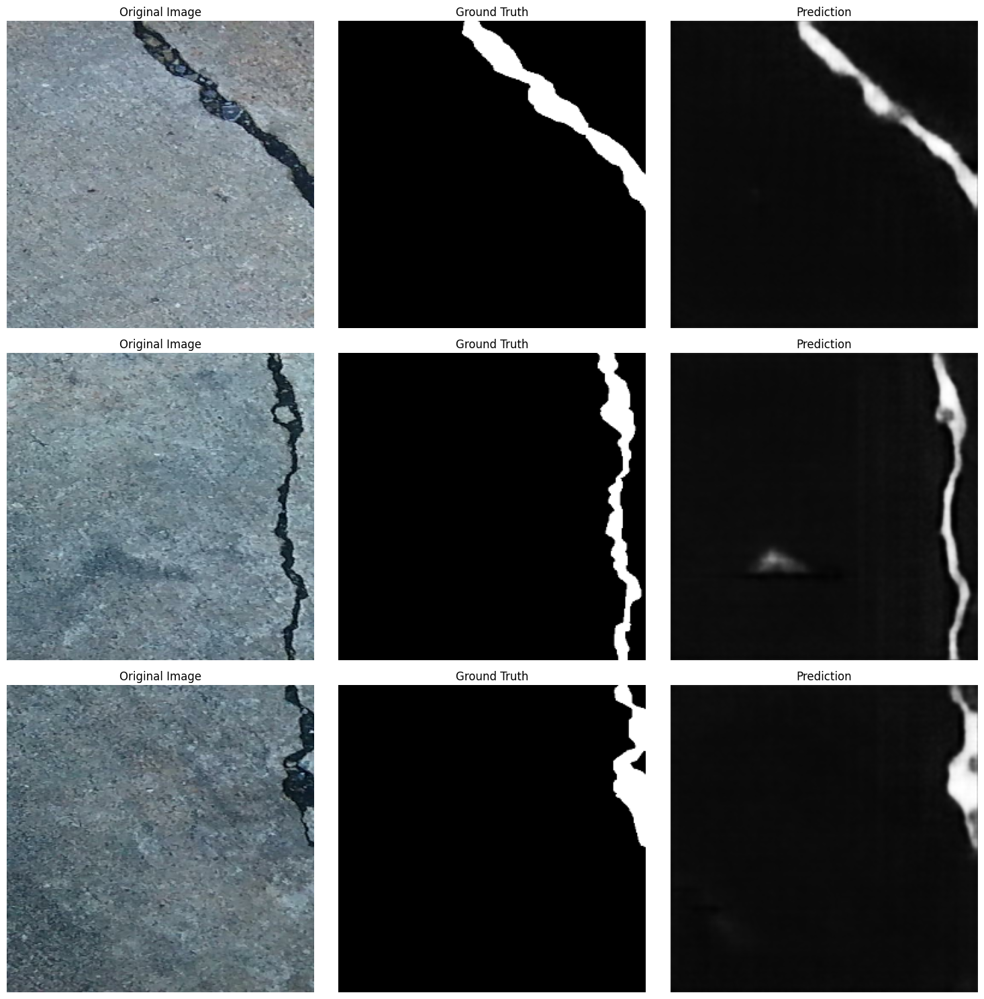


2. Side Output Visualization
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


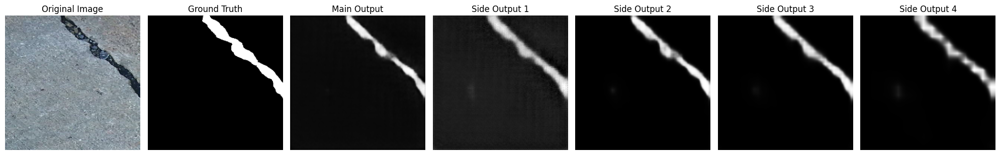

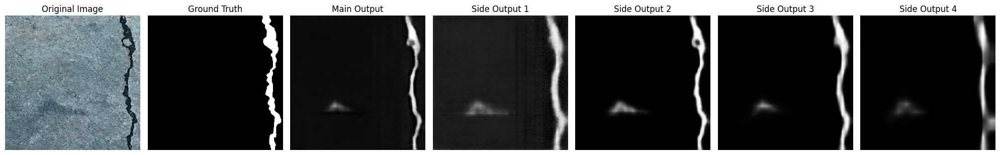

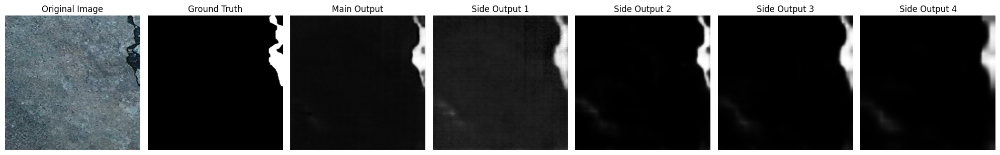


3. Prediction Overlays
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


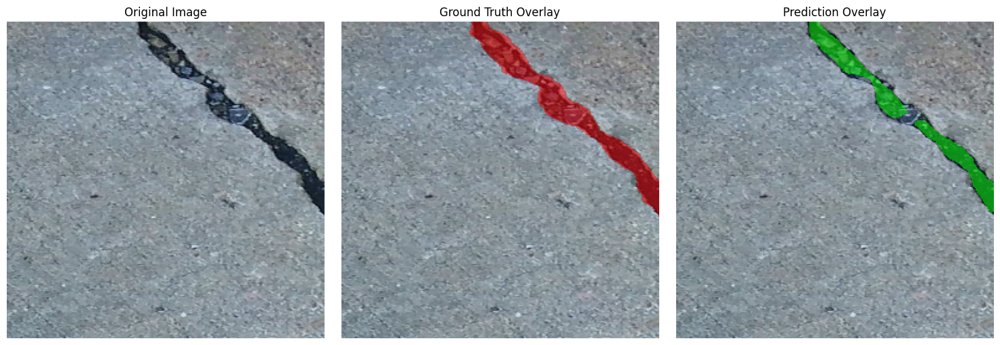

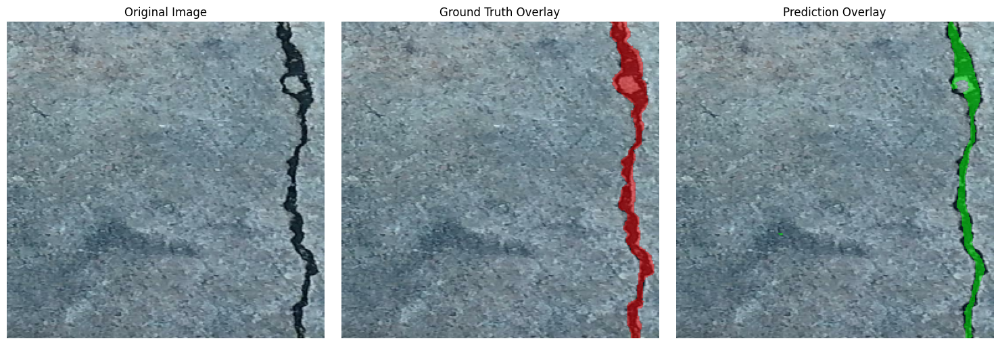

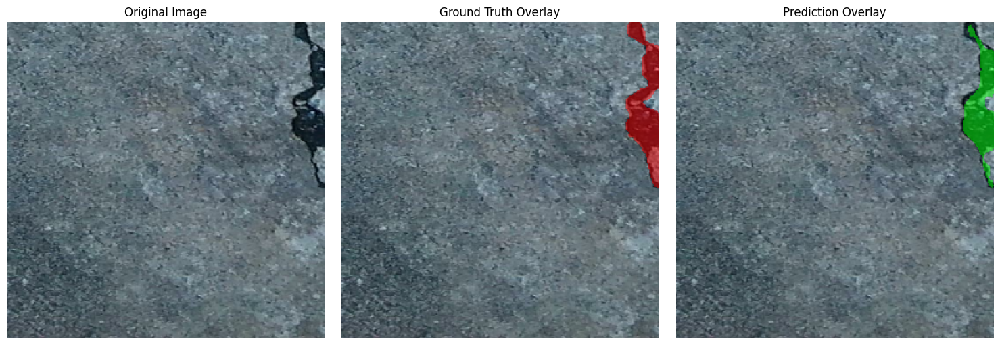

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, optimizers
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import json

# Constants
IMG_HEIGHT, IMG_WIDTH = 256, 256
BATCH_SIZE = 16
EPOCHS = 50  # Increased epochs
LEARNING_RATE = 1e-4
INPUT_SHAPE = (IMG_HEIGHT, IMG_WIDTH, 3)

# Data paths
TRAIN_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/traincrop/traincrop"
VAL_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/valcrop/valcrop"
TEST_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/testcrop/testcrop"

# Strategy for multi-GPU training
strategy = tf.distribute.MirroredStrategy()
print('Number of devices:', strategy.num_replicas_in_sync)

def load_dataset_paths(path):
    """Load image and mask paths from directory"""
    images = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.jpg')])
    masks = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.png')])
    return images, masks

def process_data_for_training(image_path, mask_path):
    """Process single image and mask for training"""
    # Read image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])

    # Read mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.cast(mask, tf.float32) / 255.0
    mask = tf.image.resize(mask, [IMG_HEIGHT, IMG_WIDTH])

    # Return multiple copies of mask for all outputs
    return image, mask

def augment_data(image, mask):
    """Apply data augmentation"""
    # Random flip left/right
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)

    # Random flip up/down
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)

    # Random brightness (only for image)
    image = tf.image.random_brightness(image, 0.1)
    image = tf.clip_by_value(image, 0, 1)

    return image, mask

def create_dataset(image_paths, mask_paths, batch_size, augment=False):
    """Create tf.data.Dataset"""
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(process_data_for_training,
                         num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        dataset = dataset.map(augment_data,
                            num_parallel_calls=tf.data.AUTOTUNE)

    # Prepare the data for multi-output model
    dataset = dataset.map(
        lambda x, y: (x, (y, y, y, y, y)),
        num_parallel_calls=tf.data.AUTOTUNE
    )

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

def hierarchical_supervised_loss(y_true, y_pred):
    """Custom loss function for hierarchical supervision"""
    # Convert inputs to float32
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    # Calculate main output loss
    main_loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    main_loss = tf.reduce_mean(main_loss)

    return main_loss

def create_fphbn_model(input_shape=INPUT_SHAPE):
    """Create the Feature Pyramid Hierarchical Boosting Network"""
    inputs = layers.Input(shape=input_shape)

    # Initial convolution block
    x = layers.Conv2D(64, 3, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    conv1 = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    def dense_block(x, filters):
        x1 = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
        x2 = layers.Conv2D(filters, 3, padding='same', activation='relu')(
            layers.concatenate([x, x1]))
        x3 = layers.Conv2D(filters, 3, padding='same', activation='relu')(
            layers.concatenate([x, x1, x2]))
        return x3

    # Feature Pyramid with dense connections
    db1 = dense_block(pool1, 128)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(db1)

    db2 = dense_block(pool2, 256)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(db2)

    db3 = dense_block(pool3, 512)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(db3)

    db4 = dense_block(pool4, 1024)

    def pyramid_fusion(high_feat, low_feat, filters):
        high_up = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(high_feat)
        low_1x1 = layers.Conv2D(filters, 1, padding='same')(low_feat)
        return layers.Add()([high_up, low_1x1])

    # Pyramid levels
    p4 = layers.Conv2D(256, 1, padding='same')(db4)
    p3 = pyramid_fusion(p4, db3, 256)
    p2 = pyramid_fusion(p3, db2, 256)
    p1 = pyramid_fusion(p2, db1, 256)

    def side_branch(x, level):
        """Create side branch with unique names"""
        name_prefix = f'side_{level}'
        x = layers.Conv2D(128, 3, padding='same', activation='relu',
                         name=f'{name_prefix}_conv1')(x)
        x = layers.Conv2D(64, 3, padding='same', activation='relu',  # Added extra convolution
                         name=f'{name_prefix}_conv2')(x)
        x = layers.Conv2D(1, 1, padding='same',
                         name=f'{name_prefix}_conv3')(x)
        if x.shape[1:3] != (IMG_HEIGHT, IMG_WIDTH):
            x = layers.Lambda(lambda img: tf.image.resize(img, (IMG_HEIGHT, IMG_WIDTH)),
                            name=f'{name_prefix}_upsample')(x)
        x = layers.Activation('sigmoid', name=f'side_output_{level}')(x)
        return x

    # Side outputs with unique names
    side1 = side_branch(p1, 'level1')
    side2 = side_branch(p2, 'level2')
    side3 = side_branch(p3, 'level3')
    side4 = side_branch(p4, 'level4')

    # Fusion layer
    fused = layers.concatenate([side1, side2, side3, side4], name='fusion')
    fused = layers.Conv2D(64, 3, padding='same', activation='relu')(fused)  # Added fusion refinement
    main_output = layers.Conv2D(1, 1, padding='same', activation='sigmoid',
                               name='main_output')(fused)

    model = models.Model(
        inputs=[inputs],
        outputs=[main_output, side1, side2, side3, side4]
    )

    return model

def display_results(model, test_dataset, num_samples=3):
    """Display test results"""
    for images, labels in test_dataset.take(1):
        predictions = model.predict(images)
        main_predictions = predictions[0]

        fig = plt.figure(figsize=(15, 5*num_samples))
        for idx in range(min(num_samples, len(images))):
            # Original Image
            plt.subplot(num_samples, 3, idx*3 + 1)
            plt.imshow(images[idx])
            plt.title('Original Image')
            plt.axis('off')

            # Ground Truth
            plt.subplot(num_samples, 3, idx*3 + 2)
            plt.imshow(labels[0][idx, ..., 0], cmap='gray')
            plt.title('Ground Truth')
            plt.axis('off')

            # Prediction
            plt.subplot(num_samples, 3, idx*3 + 3)
            plt.imshow(main_predictions[idx, ..., 0], cmap='gray')
            plt.title('Prediction')
            plt.axis('off')

        plt.tight_layout()
        plt.show()

def plot_training_history(history):
    """Plot training curves for all metrics and losses"""
    # Create a larger figure
    plt.figure(figsize=(20, 10))

    # Plot main loss
    plt.subplot(2, 3, 1)
    plt.plot(history['loss'], label='Training Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot main output metrics
    plt.subplot(2, 3, 2)
    plt.plot(history['main_output_accuracy'], label='Training Accuracy')
    plt.plot(history['val_main_output_accuracy'], label='Validation Accuracy')
    plt.title('Main Output Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 3, 3)
    plt.plot(history['main_output_mean_iou'], label='Training IoU')
    plt.plot(history['val_main_output_mean_iou'], label='Validation IoU')
    plt.title('Main Output Mean IoU')
    plt.xlabel('Epoch')
    plt.ylabel('Mean IoU')
    plt.legend()
    plt.grid(True)

    # Plot side output losses
    plt.subplot(2, 3, 4)
    for i in range(1, 5):
        if f'side_output_{i}_loss' in history:  # Check if side output loss exists
            plt.plot(history[f'side_output_{i}_loss'],
                    label=f'Side Output {i} Loss')
    plt.title('Side Output Losses')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot learning rate if available
    if 'lr' in history:
        plt.subplot(2, 3, 5)
        plt.plot(history['lr'], label='Learning Rate')
        plt.title('Learning Rate over Time')
        plt.xlabel('Epoch')
        plt.ylabel('Learning Rate')
        plt.legend()
        plt.grid(True)
        plt.yscale('log')

    plt.tight_layout()
    plt.show()

def visualize_side_outputs(model, dataset, num_samples=3):
    """Visualize main and side outputs for sample images"""
    for images, labels in dataset.take(1):
        predictions = model.predict(images)

        for idx in range(min(num_samples, len(images))):
            fig = plt.figure(figsize=(20, 4))

            # Original image
            plt.subplot(1, 7, 1)
            plt.imshow(images[idx])
            plt.title('Original Image')
            plt.axis('off')

            # Ground truth
            plt.subplot(1, 7, 2)
            plt.imshow(labels[0][idx, ..., 0], cmap='gray')
            plt.title('Ground Truth')
            plt.axis('off')

            # Main output and side outputs
            titles = ['Main Output'] + [f'Side Output {i}' for i in range(1, 5)]
            for i, (pred, title) in enumerate(zip(predictions, titles)):
                plt.subplot(1, 7, i + 3)
                plt.imshow(pred[idx, ..., 0], cmap='gray')
                plt.title(title)
                plt.axis('off')

            plt.tight_layout()
            plt.show()

def visualize_prediction_overlay(model, dataset, num_samples=3, threshold=0.5):
    """Visualize predictions overlaid on original images"""
    for images, labels in dataset.take(1):
        predictions = model.predict(images)
        main_predictions = predictions[0]

        for idx in range(min(num_samples, len(images))):
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            # Original image
            axes[0].imshow(images[idx])
            axes[0].set_title('Original Image')
            axes[0].axis('off')

            # Ground truth overlay
            axes[1].imshow(images[idx])
            mask = labels[0][idx, ..., 0] > threshold
            overlay = np.zeros((*mask.shape, 4))
            overlay[mask] = [1, 0, 0, 0.5]  # Red with 0.5 alpha
            axes[1].imshow(overlay)
            axes[1].set_title('Ground Truth Overlay')
            axes[1].axis('off')

            # Prediction overlay
            axes[2].imshow(images[idx])
            pred_mask = main_predictions[idx, ..., 0] > threshold
            pred_overlay = np.zeros((*pred_mask.shape, 4))
            pred_overlay[pred_mask] = [0, 1, 0, 0.5]  # Green with 0.5 alpha
            axes[2].imshow(pred_overlay)
            axes[2].set_title('Prediction Overlay')
            axes[2].axis('off')

            plt.tight_layout()
            plt.show()

# Main execution
if __name__ == "__main__":
    # Load dataset paths
    train_images, train_masks = load_dataset_paths(TRAIN_PATH)
    val_images, val_masks = load_dataset_paths(VAL_PATH)
    test_images, test_masks = load_dataset_paths(TEST_PATH)

    print(f"Training images: {len(train_images)}")
    print(f"Validation images: {len(val_images)}")
    print(f"Test images: {len(test_images)}")

    # Create datasets
    train_dataset = create_dataset(train_images, train_masks, BATCH_SIZE, augment=True)
    val_dataset = create_dataset(val_images, val_masks, BATCH_SIZE)
    test_dataset = create_dataset(test_images, test_masks, BATCH_SIZE)

    # Create and compile model
    print("\nCreating and compiling model...")
    with strategy.scope():
        model = create_fphbn_model()

        # Update loss dictionary with correct output names
        losses = {
            'main_output': hierarchical_supervised_loss,
            'side_output_level1': hierarchical_supervised_loss,
            'side_output_level2': hierarchical_supervised_loss,
            'side_output_level3': hierarchical_supervised_loss,
            'side_output_level4': hierarchical_supervised_loss
        }

        loss_weights = {
            'main_output': 1.0,
            'side_output_level1': 0.5,
            'side_output_level2': 0.75,
            'side_output_level3': 0.875,
            'side_output_level4': 1.0
        }

        metrics = {
            'main_output': [
                tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                tf.keras.metrics.MeanIoU(num_classes=2, name='mean_iou')
            ],
            'side_output_level1': [tf.keras.metrics.MeanIoU(num_classes=2, name='mean_iou')],  # Added side output metrics
            'side_output_level2': [tf.keras.metrics.MeanIoU(num_classes=2, name='mean_iou')],
            'side_output_level3': [tf.keras.metrics.MeanIoU(num_classes=2, name='mean_iou')],
            'side_output_level4': [tf.keras.metrics.MeanIoU(num_classes=2, name='mean_iou')]
        }

        model.compile(
            optimizer=optimizers.Adam(learning_rate=LEARNING_RATE),
            loss=losses,
            loss_weights=loss_weights,
            metrics=metrics
        )

    # Model summary
    model.summary()

    # Callbacks
    callbacks_list = [
        callbacks.ModelCheckpoint(
            "fphbn_model_best.keras",
            save_best_only=True,
            monitor='val_loss',
            mode='min'
        ),
        callbacks.EarlyStopping(
            patience=5,
            restore_best_weights=True,
            monitor='val_loss',
            mode='min'
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-6,
            mode='min'
        ),
        callbacks.TensorBoard(
            log_dir='./logs',
            write_graph=True,
            update_freq='epoch'
        )
    ]

    # Train the model
    print("\nStarting training...")
    history = model.fit(
        train_dataset,
        epochs=EPOCHS,
        validation_data=val_dataset,
        callbacks=callbacks_list,
        validation_steps=len(val_images) // BATCH_SIZE,
        steps_per_epoch=len(train_images) // BATCH_SIZE
    )

    # Save training history
    history_dict = {}
    for key in history.history:
        history_dict[key] = [float(val) for val in history.history[key]]

    with open('fphbn_training_history.json', 'w') as f:
        json.dump(history_dict, f, indent=4)

    print("\nSaved training history to 'fphbn_training_history.json'")

    # Evaluate model
    print("\nEvaluating model on test set...")
    test_results = model.evaluate(test_dataset)

    # Print test results
    metric_names = ['Loss'] + [m.name for m in model.metrics]
    for name, value in zip(metric_names, test_results):
        print(f"Test {name}: {value:.4f}")

    # Display some test results
    print("\nGenerating visualization of results...")
    display_results(model, test_dataset)

    # Plot training history
    print("\nPlotting training history...")
    plot_training_history(history.history)

    # Save training history
    history_dict = {}
    for key in history.history:
        history_dict[key] = [float(val) for val in history.history[key]]

    with open('fphbn_training_history.json', 'w') as f:
        json.dump(history_dict, f, indent=4)

    print("\nSaved training history to 'fphbn_training_history.json'")

    # Evaluate model
    print("\nEvaluating model on test set...")
    test_results = model.evaluate(test_dataset)

    # Print test results
    metric_names = ['Loss'] + [m.name for m in model.metrics]
    for name, value in zip(metric_names, test_results):
        print(f"Test {name}: {value:.4f}")

    # Generate visualizations
    print("\nGenerating visualization of results...")
    print("\n1. Basic Prediction Comparison")
    display_results(model, test_dataset)

    print("\n2. Side Output Visualization")
    visualize_side_outputs(model, test_dataset)

    print("\n3. Prediction Overlays")
    visualize_prediction_overlay(model, test_dataset)

    # Save a summary figure
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 2)
    plt.plot(history.history['main_output_accuracy'], label='Training Acc')
    plt.plot(history.history['val_main_output_accuracy'], label='Validation Acc')
    plt.title('Model Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(history.history['main_output_mean_iou'], label='Training IoU')
    plt.plot(history.history['val_main_output_mean_iou'], label='Validation IoU')
    plt.title('Model IoU')
    plt.legend()
    plt.grid(True)

    if 'lr' in history.history:
        plt.subplot(2, 2, 4)
        plt.plot(history.history['lr'])
        plt.title('Learning Rate')
        plt.yscale('log')
        plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_summary.png', bbox_inches='tight', dpi=300)
    plt.close()

Number of devices: 2
Training images: 1896
Validation images: 348
Test images: 1124


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_52 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_53 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_52[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 128, 128,  │          0 │ conv2d_53[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_54 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_11… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_55 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_54[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_12    │ (None, 64, 64,    │          0 │ conv2d_55[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_56 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_12… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_56[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_13    │ (None, 32, 32,    │          0 │ conv2d_57[0][0]   │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_13… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 32, 32,    │  2,359,808 │ conv2d_58[0][0]   │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_14    │ (None, 16, 16,    │          0 │ conv2d_59[0][0]   │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 256, 512)  │          0 │ max_pooling2d_14… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 256, 512)  │      1,024 │ reshape[0][0]     │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 256, 512)  │  1,050,624 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_6 (Add)         │ (None, 256, 512)  │          0 │ layer_normalizat… │
│                     │                   │            │ multi_head_atten

 Total params: 20,030,913 (76.41 MB)

 Trainable params: 20,030,913 (76.41 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 100s 544ms/step - accuracy: 0.8294 - loss: 0.3728 - mean_io_u_1: 0.4766 - val_accuracy: 0.9338 - val_loss: 0.1834 - val_mean_io_u_1: 0.4700 - learning_rate: 1.0000e-04
Epoch 2/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - accuracy: 0.9634 - loss: 0.1581 - mean_io_u_1: 0.4843 - val_accuracy: 0.9717 - val_loss: 0.0807 - val_mean_io_u_1: 0.4877 - learning_rate: 1.0000e-04
Epoch 3/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 62s 522ms/step - accuracy: 0.9477 - loss: 0.1511 - mean_io_u_1: 0.4766 - val_accuracy: 0.9344 - val_loss: 0.1809 - val_mean_io_u_1: 0.4700 - learning_rate: 1.0000e-04
Epoch 4/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.9742 - loss: 0.1307 - mean_io_u_1: 0.4843 - val_accuracy: 0.9726 - val_loss: 0.0493 - val_mean_io_u_1: 0.4877 - learning_rate: 1.0000e-04
Epoch 5/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 61s 517ms/step - accuracy: 0.9494 - loss: 0.1448 - mean_io_u_1: 0.4766 - val_accuracy: 0.9365 - val_loss: 0.1739 - val_mean_io_u_1: 0.4

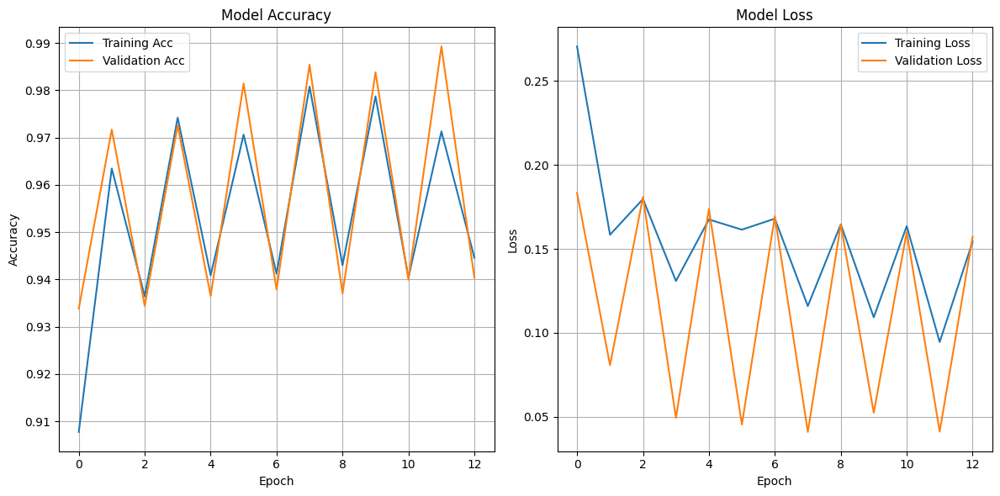

71/71 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - accuracy: 0.9485 - loss: 0.1570 - mean_io_u_1: 0.4769
Test Loss: 0.1604
Test Accuracy: 0.9459
Test Mean IoU: 0.4739
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


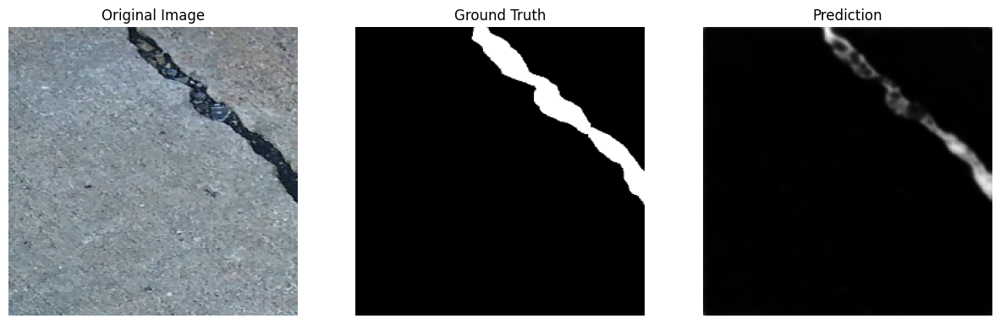

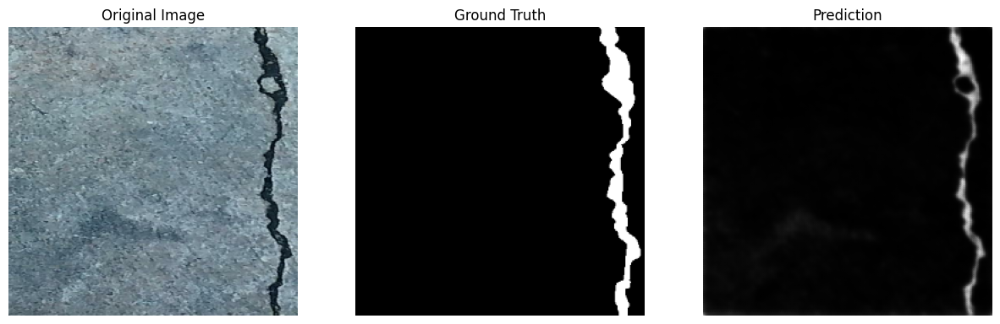

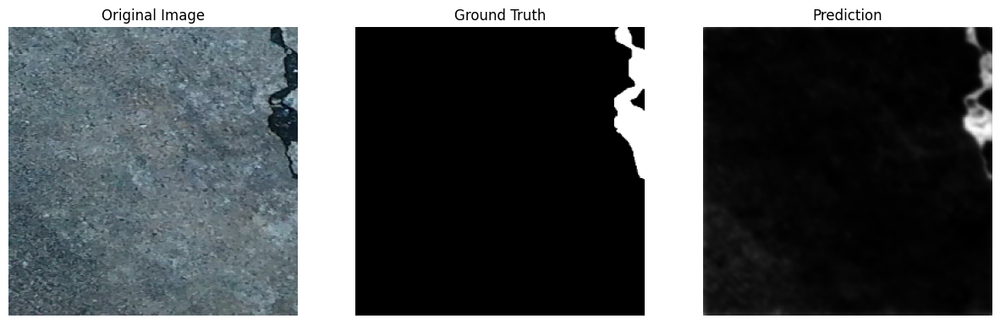


Saved training history to 'conv_transformer_training_history.json'


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, optimizers
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import json

# Constants
IMG_HEIGHT, IMG_WIDTH = 256, 256
BATCH_SIZE = 16
EPOCHS = 50
LEARNING_RATE = 1e-4
INPUT_SHAPE = (IMG_HEIGHT, IMG_WIDTH, 3)

# Data paths
TRAIN_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/traincrop/traincrop"
VAL_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/valcrop/valcrop"
TEST_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/testcrop/testcrop"

# Strategy for multi-GPU training
strategy = tf.distribute.MirroredStrategy()
print('Number of devices:', strategy.num_replicas_in_sync)

# Data Loading and Preprocessing
def load_dataset_paths(path):
    images = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.jpg')])
    masks = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.png')])
    return images, masks

def process_data_for_training(image_path, mask_path):
    # Read image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])

    # Read mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.cast(mask, tf.float32) / 255.0
    mask = tf.image.resize(mask, [IMG_HEIGHT, IMG_WIDTH])

    return image, mask

def augment_data(image, mask):
    # Random flip left/right
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)

    # Random flip up/down
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)

    # Random brightness
    image = tf.image.random_brightness(image, 0.1)
    image = tf.clip_by_value(image, 0, 1)

    return image, mask

def create_dataset(image_paths, mask_paths, batch_size, augment=False):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(process_data_for_training,
                          num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        dataset = dataset.map(augment_data,
                              num_parallel_calls=tf.data.AUTOTUNE)

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

# Load dataset paths
train_images, train_masks = load_dataset_paths(TRAIN_PATH)
val_images, val_masks = load_dataset_paths(VAL_PATH)
test_images, test_masks = load_dataset_paths(TEST_PATH)

print(f"Training images: {len(train_images)}")
print(f"Validation images: {len(val_images)}")
print(f"Test images: {len(test_images)}")

# Create datasets
train_dataset = create_dataset(train_images, train_masks, BATCH_SIZE, augment=True)
val_dataset = create_dataset(val_images, val_masks, BATCH_SIZE)
test_dataset = create_dataset(test_images, test_masks, BATCH_SIZE)

# Model Definition: Convolutional-Transformer Model
def create_conv_transformer_model(input_shape=INPUT_SHAPE):
    inputs = layers.Input(shape=input_shape)

    # Encoder: convolutional layers
    c1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, 3, activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D(2)(c1)

    c2 = layers.Conv2D(128, 3, activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, 3, activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D(2)(c2)

    c3 = layers.Conv2D(256, 3, activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, 3, activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D(2)(c3)

    c4 = layers.Conv2D(512, 3, activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, 3, activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D(2)(c4)

    # Bottleneck: apply transformer layers
    shape = tf.keras.backend.int_shape(p4)
    H, W, C = shape[1], shape[2], shape[3]
    n_patches = H * W
    embed_dim = C

    # Reshape to (batch_size, n_patches, embed_dim)
    x = layers.Reshape((n_patches, embed_dim))(p4)

    # Transformer layers
    num_heads = 8
    transformer_units = [embed_dim * 2, embed_dim]

    # Apply Transformer Encoder blocks
    for _ in range(2):
        # Layer normalization
        x1 = layers.LayerNormalization(epsilon=1e-6)(x)
        # Multi-head Attention
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim // num_heads)(x1, x1)
        # Skip connection
        x2 = layers.Add()([x1, attention_output])

        # MLP
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        x3 = layers.Dense(transformer_units[0], activation='relu')(x3)
        x3 = layers.Dense(transformer_units[1], activation='relu')(x3)
        # Skip connection
        x = layers.Add()([x2, x3])

    # Reshape back to spatial dimensions
    x = layers.Reshape((H, W, embed_dim))(x)

    # Decoder: upsampling and concatenation
    u4 = layers.Conv2DTranspose(512, 2, strides=2, padding='same')(x)
    u4 = layers.concatenate([u4, c4])
    c5 = layers.Conv2D(512, 3, activation='relu', padding='same')(u4)
    c5 = layers.Conv2D(512, 3, activation='relu', padding='same')(c5)

    u5 = layers.Conv2DTranspose(256, 2, strides=2, padding='same')(c5)
    u5 = layers.concatenate([u5, c3])
    c6 = layers.Conv2D(256, 3, activation='relu', padding='same')(u5)
    c6 = layers.Conv2D(256, 3, activation='relu', padding='same')(c6)

    u6 = layers.Conv2DTranspose(128, 2, strides=2, padding='same')(c6)
    u6 = layers.concatenate([u6, c2])
    c7 = layers.Conv2D(128, 3, activation='relu', padding='same')(u6)
    c7 = layers.Conv2D(128, 3, activation='relu', padding='same')(c7)

    u7 = layers.Conv2DTranspose(64, 2, strides=2, padding='same')(c7)
    u7 = layers.concatenate([u7, c1])
    c8 = layers.Conv2D(64, 3, activation='relu', padding='same')(u7)
    c8 = layers.Conv2D(64, 3, activation='relu', padding='same')(c8)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(c8)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create and Compile the Model
with strategy.scope():
    model = create_conv_transformer_model()

    model.compile(
        optimizer=optimizers.Adam(learning_rate=LEARNING_RATE),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.MeanIoU(num_classes=2)]
    )

model.summary()

# Callbacks
callbacks_list = [
    callbacks.ModelCheckpoint(
        "conv_transformer_model_best.keras",
        save_best_only=True,
        monitor='val_loss',
        mode='min'
    ),
    callbacks.EarlyStopping(
        patience=5,
        restore_best_weights=True,
        monitor='val_loss',
        mode='min'
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-6,
        mode='min'
    ),
    callbacks.TensorBoard(
        log_dir='./logs',
        write_graph=True,
        update_freq='epoch'
    )
]

# Train the Model
history = model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=val_dataset,
    callbacks=callbacks_list,
    steps_per_epoch=len(train_images) // BATCH_SIZE,
    validation_steps=len(val_images) // BATCH_SIZE
)

# Plot Training History
def plot_training_history(history):
    plt.figure(figsize=(12, 6))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Acc')
    plt.plot(history.history['val_accuracy'], label='Validation Acc')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_training_history(history)

# Evaluate the Model
test_results = model.evaluate(test_dataset)
print(f"Test Loss: {test_results[0]:.4f}")
print(f"Test Accuracy: {test_results[1]:.4f}")
print(f"Test Mean IoU: {test_results[2]:.4f}")

# Visualize Predictions
def display_results(model, test_dataset, num_samples=3):
    for images, masks in test_dataset.take(1):
        predictions = model.predict(images)
        for i in range(num_samples):
            fig, ax = plt.subplots(1, 3, figsize=(15, 5))
            ax[0].imshow(images[i])
            ax[0].set_title('Original Image')
            ax[0].axis('off')

            ax[1].imshow(masks[i].numpy().squeeze(), cmap='gray')
            ax[1].set_title('Ground Truth')
            ax[1].axis('off')

            ax[2].imshow(predictions[i].squeeze(), cmap='gray')
            ax[2].set_title('Prediction')
            ax[2].axis('off')

            plt.show()

display_results(model, test_dataset)

# Save Training History
history_dict = {}
for key in history.history:
    history_dict[key] = [float(val) for val in history.history[key]]

with open('conv_transformer_training_history.json', 'w') as f:
    json.dump(history_dict, f, indent=4)

print("\nSaved training history to 'conv_transformer_training_history.json'")


Number of devices: 2
Training images: 1896
Validation images: 348
Test images: 1124

Creating and compiling model...


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128, 128,  │          0 │ max_pooling2d[0]… │
│ (Concatenate)       │ 192)              │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    221,312 │ concatenate[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 128, 128,  │          0 │ max_pooling2d[0]… │
│ (Concatenate)       │ 320)              │            │ conv2d_2[0][0],   │
│                     │                   │            │ conv2d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    368,768 │ concatenate_1[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_4[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 64, 64,    │          0 │ max_pooling2d_1[… │
│ (Concatenate)       │ 384)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │    884,992 │ concatenate_2[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 64, 64,    │          0 │ max_pooling2d_1[… │
│ (Concatenate)       │ 640)              │            │ conv2d_5[0][0],   │
│                     │                   │            │ conv2d_6[0][0]  

 Total params: 59,204,421 (225.85 MB)

 Trainable params: 59,204,293 (225.85 MB)

 Non-trainable params: 128 (512.00 B)


Starting training...
Epoch 1/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 133s 701ms/step - loss: 1.3381 - main_output_accuracy: 0.9569 - main_output_binary_iou: 0.4797 - val_loss: 1.5215 - val_main_output_accuracy: 0.9406 - val_main_output_binary_iou: 0.4703 - learning_rate: 1.0000e-04
Epoch 2/50
  1/118 ━━━━━━━━━━━━━━━━━━━━ 23:54 12s/step - loss: 0.9609 - main_output_accuracy: 0.9673 - main_output_binary_iou: 0.4865

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


118/118 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.9466 - main_output_accuracy: 0.9750 - main_output_binary_iou: 0.4892 - val_loss: 1.4677 - val_main_output_accuracy: 0.9594 - val_main_output_binary_iou: 0.4797 - learning_rate: 1.0000e-04
Epoch 3/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 82s 687ms/step - loss: 0.9997 - main_output_accuracy: 0.9569 - main_output_binary_iou: 0.4796 - val_loss: 1.5164 - val_main_output_accuracy: 0.9463 - val_main_output_binary_iou: 0.4732 - learning_rate: 1.0000e-04
Epoch 4/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.9460 - main_output_accuracy: 0.9434 - main_output_binary_iou: 0.4742 - val_loss: 1.4676 - val_main_output_accuracy: 0.9661 - val_main_output_binary_iou: 0.4831 - learning_rate: 1.0000e-04
Epoch 5/50
118/118 ━━━━━━━━━━━━━━━━━━━━ 85s 721ms/step - loss: 0.8720 - main_output_accuracy: 0.9584 - main_output_binary_iou: 0.4805 - val_loss: 0.9206 - val_main_output_accuracy: 0.9451 - val_main_output_binary_iou: 0.4725 - learning_rate: 1.0000e-04
Ep

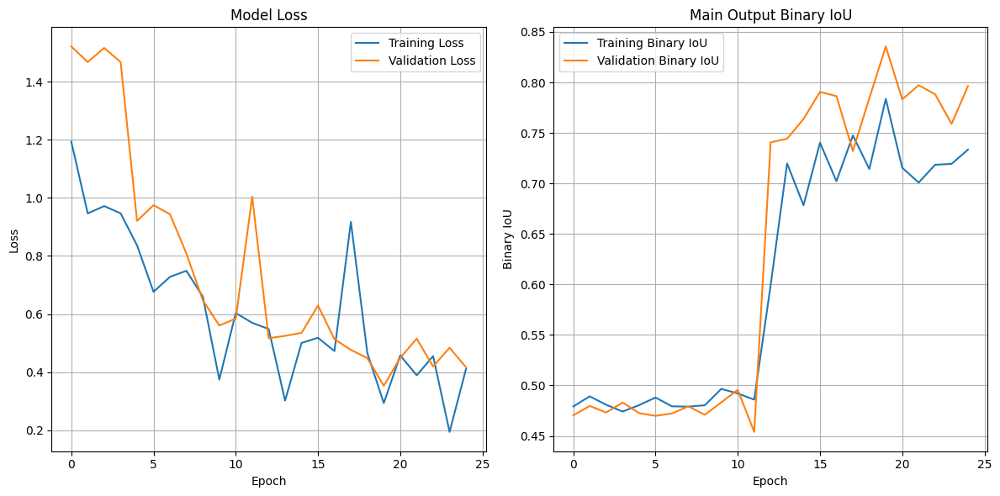


Visualizing predictions on test set...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


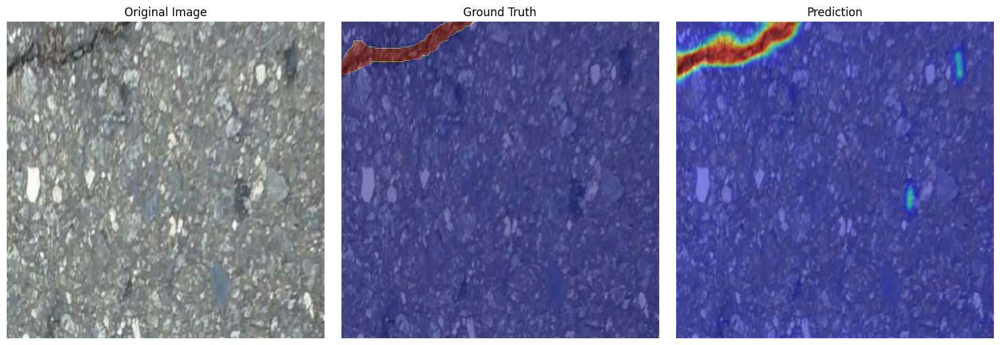

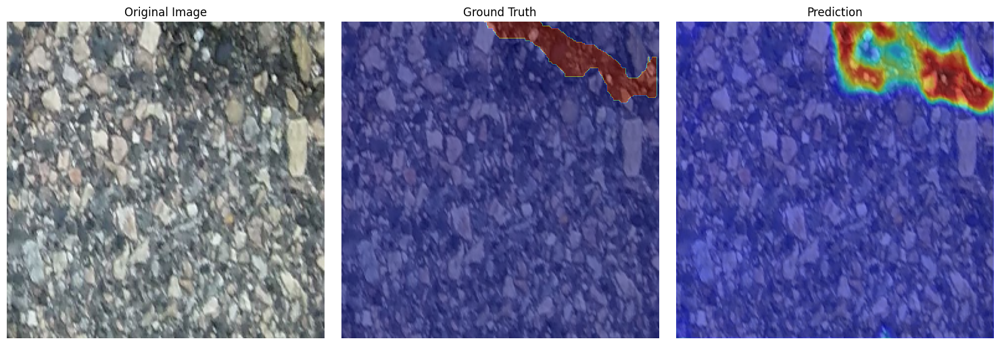

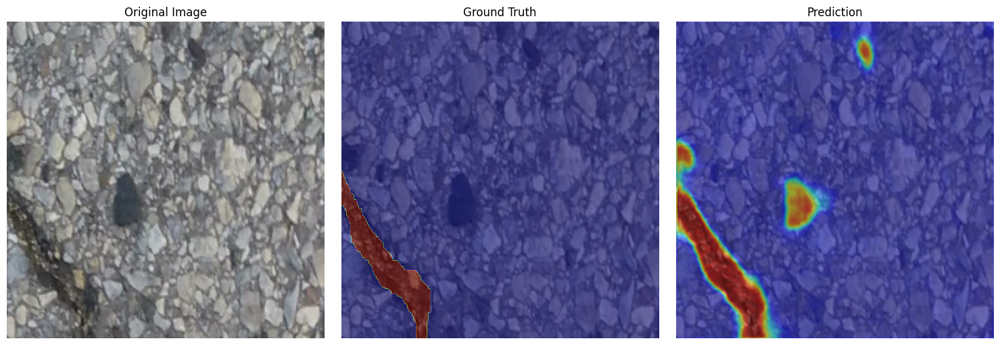

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, optimizers
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import json

# Constants
IMG_HEIGHT, IMG_WIDTH = 256, 256
BATCH_SIZE = 16
EPOCHS = 50
LEARNING_RATE = 1e-4
INPUT_SHAPE = (IMG_HEIGHT, IMG_WIDTH, 3)

# Data paths
TRAIN_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/traincrop/traincrop"
VAL_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/valcrop/valcrop"
TEST_PATH = "/kaggle/input/crack50020220509t090436z001/CRACK500/testcrop/testcrop"

# Strategy for multi-GPU training
strategy = tf.distribute.MirroredStrategy()
print('Number of devices:', strategy.num_replicas_in_sync)

def load_dataset_paths(path):
    """Load image and mask paths from directory."""
    images = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.jpg')])
    masks = sorted([os.path.join(path, f) for f in os.listdir(path) if f.endswith('.png')])
    return images, masks

def process_data_for_training(image_path, mask_path):
    """Process single image and mask for training."""
    # Read and preprocess image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])
    image = tf.cast(image, tf.float32) / 255.0

    # Read and preprocess mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, [IMG_HEIGHT, IMG_WIDTH])
    mask = tf.cast(mask, tf.float32) / 255.0
    mask = tf.where(mask >= 0.5, 1.0, 0.0)  # Binarize the mask

    return image, mask

def rotate_image(image, angle, is_mask=False):
    """Rotate an image or mask using TensorFlow's transformation utilities."""
    angle_rad = angle * np.pi / 180

    # Create the 2D rotation matrix
    rotation_matrix = tf.stack([
        [tf.cos(angle_rad), -tf.sin(angle_rad), 0],
        [tf.sin(angle_rad), tf.cos(angle_rad), 0]
    ])

    # Flatten the rotation matrix to match the transform format
    transform_matrix = tf.concat([rotation_matrix, [[0], [0]]], axis=1)
    transform_matrix = tf.reshape(transform_matrix, [-1])

    # TensorFlow expects the transform matrix in a flattened form
    transform = tf.stack([
        transform_matrix[0], transform_matrix[1], transform_matrix[2],
        transform_matrix[3], transform_matrix[4], transform_matrix[5],
        0.0, 0.0
    ])

    # Add batch dimension to the image
    image = tf.expand_dims(image, 0)

    # Apply the transformation
    transformed_image = tf.raw_ops.ImageProjectiveTransformV3(
        images=image,
        transforms=tf.expand_dims(transform, 0),
        output_shape=[IMG_HEIGHT, IMG_WIDTH],
        interpolation="NEAREST" if is_mask else "BILINEAR",
        fill_value=0.0  # Use 0.0 to fill empty regions
    )

    # Remove the batch dimension
    return tf.squeeze(transformed_image, 0)


@tf.function
def augment_data(image, mask):
    """Apply data augmentation."""
    # Random flip left/right
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)

    # Random flip up/down
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)

    # Random rotation
    if tf.random.uniform(()) > 0.5:
        angle = tf.random.uniform((), minval=-15, maxval=15)
        image = rotate_image(image, angle, is_mask=False)
        mask = rotate_image(mask, angle, is_mask=True)

    # Random zoom
    if tf.random.uniform(()) > 0.5:
        scales = list(np.arange(0.8, 1.0, 0.01))
        scale = np.random.choice(scales)
        new_height = tf.cast(scale * IMG_HEIGHT, tf.int32)
        new_width = tf.cast(scale * IMG_WIDTH, tf.int32)
        image = tf.image.resize(image, [new_height, new_width])
        mask = tf.image.resize(mask, [new_height, new_width])

        # Pad or crop to maintain size
        image = tf.image.resize_with_crop_or_pad(image, IMG_HEIGHT, IMG_WIDTH)
        mask = tf.image.resize_with_crop_or_pad(mask, IMG_HEIGHT, IMG_WIDTH)

    # Random brightness
    image = tf.image.random_brightness(image, 0.1)
    image = tf.clip_by_value(image, 0, 1)

    return image, mask




def create_dataset(image_paths, mask_paths, batch_size, augment=False):
    """Create tf.data.Dataset."""
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.shuffle(buffer_size=len(image_paths))
    dataset = dataset.map(process_data_for_training, num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)

    # Prepare the data for multi-output model
    dataset = dataset.map(
        lambda x, y: (x, {'main_output': y, 'side_output_level1': y, 'side_output_level2': y,
                          'side_output_level3': y, 'side_output_level4': y}),
        num_parallel_calls=tf.data.AUTOTUNE
    )

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

def hierarchical_supervised_loss(y_true, y_pred):
    """Custom loss function for hierarchical supervision."""
    # Binary cross-entropy loss
    loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return tf.reduce_mean(loss)

def create_fphbn_model(input_shape=INPUT_SHAPE):
    """Create the Feature Pyramid Hierarchical Boosting Network."""
    inputs = layers.Input(shape=input_shape)

    # Initial convolution block
    x = layers.Conv2D(64, 3, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    conv1 = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    def dense_block(x, filters):
        """Dense block with three layers."""
        x1 = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
        x2 = layers.Conv2D(filters, 3, padding='same', activation='relu')(
            layers.concatenate([x, x1]))
        x3 = layers.Conv2D(filters, 3, padding='same', activation='relu')(
            layers.concatenate([x, x1, x2]))
        return x3

    # Feature Pyramid with dense connections
    db1 = dense_block(pool1, 128)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(db1)

    db2 = dense_block(pool2, 256)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(db2)

    db3 = dense_block(pool3, 512)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(db3)

    db4 = dense_block(pool4, 1024)

    def pyramid_fusion(high_feat, low_feat, filters):
        """Fuse higher and lower features."""
        high_up = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(high_feat)
        low_1x1 = layers.Conv2D(filters, 1, padding='same')(low_feat)
        return layers.Add()([high_up, low_1x1])

    # Pyramid levels
    p4 = layers.Conv2D(256, 1, padding='same')(db4)
    p3 = pyramid_fusion(p4, db3, 256)
    p2 = pyramid_fusion(p3, db2, 256)
    p1 = pyramid_fusion(p2, db1, 256)

    def side_branch(x, level):
        """Create side branch with unique names."""
        name_prefix = f'side_{level}'
        x = layers.Conv2D(128, 3, padding='same', activation='relu',
                          name=f'{name_prefix}_conv1')(x)
        x = layers.Conv2D(64, 3, padding='same', activation='relu',
                          name=f'{name_prefix}_conv2')(x)
        x = layers.Conv2D(1, 1, padding='same', name=f'{name_prefix}_conv3')(x)
        if x.shape[1] != IMG_HEIGHT:
            x = layers.UpSampling2D(size=(IMG_HEIGHT // x.shape[1], IMG_WIDTH // x.shape[2]),
                                    interpolation='bilinear', name=f'{name_prefix}_upsample')(x)
        x = layers.Activation('sigmoid', name=f'side_output_{level}')(x)
        return x

    # Side outputs with unique names
    side1 = side_branch(p1, 'level1')
    side2 = side_branch(p2, 'level2')
    side3 = side_branch(p3, 'level3')
    side4 = side_branch(p4, 'level4')

    # Fusion layer
    fused = layers.Concatenate(name='fusion')([side1, side2, side3, side4])
    fused = layers.Conv2D(64, 3, padding='same', activation='relu')(fused)
    main_output = layers.Conv2D(1, 1, padding='same', activation='sigmoid', name='main_output')(fused)

    model = models.Model(
        inputs=[inputs],
        outputs=[main_output, side1, side2, side3, side4]
    )

    return model

def plot_training_history(history):
    """Plot training curves for all metrics and losses."""
    # Convert history to DataFrame for easier plotting
    import pandas as pd
    history_df = pd.DataFrame(history)

    # Plot main loss
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history_df['loss'], label='Training Loss')
    plt.plot(history_df['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot main output Binary IoU
    plt.subplot(1, 2, 2)
    plt.plot(history_df['main_output_binary_iou'], label='Training Binary IoU')
    plt.plot(history_df['val_main_output_binary_iou'], label='Validation Binary IoU')
    plt.title('Main Output Binary IoU')
    plt.xlabel('Epoch')
    plt.ylabel('Binary IoU')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

def visualize_predictions(model, dataset, num_samples=3, threshold=0.5):
    """Visualize predictions overlaid on original images."""
    for images, labels in dataset.take(1):
        predictions = model.predict(images)
        main_predictions = predictions[0]

        for idx in range(min(num_samples, len(images))):
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            # Original image
            axes[0].imshow(images[idx])
            axes[0].set_title('Original Image')
            axes[0].axis('off')

            # Ground truth overlay
            axes[1].imshow(images[idx])
            mask = labels['main_output'][idx, ..., 0]
            axes[1].imshow(mask, alpha=0.5, cmap='jet')
            axes[1].set_title('Ground Truth')
            axes[1].axis('off')

            # Prediction overlay
            axes[2].imshow(images[idx])
            pred_mask = main_predictions[idx, ..., 0]
            axes[2].imshow(pred_mask, alpha=0.5, cmap='jet')
            axes[2].set_title('Prediction')
            axes[2].axis('off')

            plt.tight_layout()
            plt.show()

# Main execution
if __name__ == "__main__":
    # Load dataset paths
    train_images, train_masks = load_dataset_paths(TRAIN_PATH)
    val_images, val_masks = load_dataset_paths(VAL_PATH)
    test_images, test_masks = load_dataset_paths(TEST_PATH)

    print(f"Training images: {len(train_images)}")
    print(f"Validation images: {len(val_images)}")
    print(f"Test images: {len(test_images)}")

    # Create datasets
    train_dataset = create_dataset(train_images, train_masks, BATCH_SIZE, augment=True)
    val_dataset = create_dataset(val_images, val_masks, BATCH_SIZE)
    test_dataset = create_dataset(test_images, test_masks, BATCH_SIZE)

    # Create and compile model
    print("\nCreating and compiling model...")
    with strategy.scope():
        model = create_fphbn_model()

        # Define losses and metrics
        losses = {
            'main_output': hierarchical_supervised_loss,
            'side_output_level1': hierarchical_supervised_loss,
            'side_output_level2': hierarchical_supervised_loss,
            'side_output_level3': hierarchical_supervised_loss,
            'side_output_level4': hierarchical_supervised_loss
        }

        loss_weights = {
            'main_output': 1.0,
            'side_output_level1': 0.5,
            'side_output_level2': 0.75,
            'side_output_level3': 0.875,
            'side_output_level4': 1.0
        }

        metrics = {
            'main_output': [
                tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                tf.keras.metrics.BinaryIoU(target_class_ids=[0, 1], threshold=0.5, name='binary_iou')
            ]
            # Side outputs can have metrics if desired
        }

        model.compile(
            optimizer=optimizers.Adam(learning_rate=LEARNING_RATE),
            loss=losses,
            loss_weights=loss_weights,
            metrics=metrics
        )

    # Model summary
    model.summary()

    # Callbacks
    callbacks_list = [
        callbacks.ModelCheckpoint(
            "fphbn_model_best.keras",
            save_best_only=True,
            monitor='val_loss',
            mode='min'
        ),
        callbacks.EarlyStopping(
            patience=5,
            restore_best_weights=True,
            monitor='val_loss',
            mode='min'
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-6,
            mode='min'
        ),
        callbacks.TensorBoard(
            log_dir='./logs',
            write_graph=True,
            update_freq='epoch'
        )
    ]

    # Train the model
    print("\nStarting training...")
    history = model.fit(
        train_dataset,
        epochs=EPOCHS,
        validation_data=val_dataset,
        callbacks=callbacks_list,
        validation_steps=len(val_images) // BATCH_SIZE,
        steps_per_epoch=len(train_images) // BATCH_SIZE
    )

    # Save training history
    with open('fphbn_training_history.json', 'w') as f:
        json.dump(history.history, f, indent=4)

    print("\nSaved training history to 'fphbn_training_history.json'")

    # Evaluate model
    print("\nEvaluating model on test set...")
    test_results = model.evaluate(test_dataset)

    # Print test results
    print("\nTest Results:")
    for name, value in zip(model.metrics_names, test_results):
        print(f"{name}: {value:.4f}")

    # Plot training history
    print("\nPlotting training history...")
    plot_training_history(history.history)

    # Visualize predictions
    print("\nVisualizing predictions on test set...")
    visualize_predictions(model, test_dataset)




Calculating detailed statistics...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

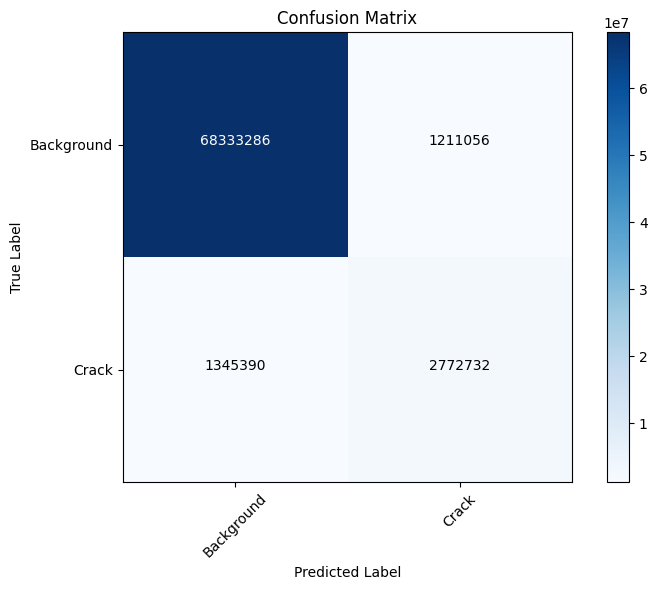


Visualizing predictions with additional metrics...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


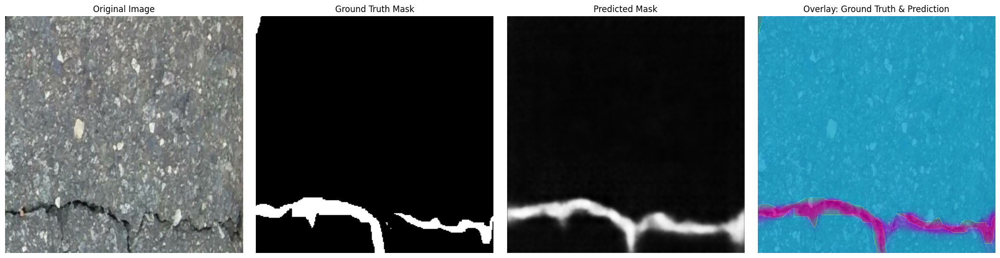

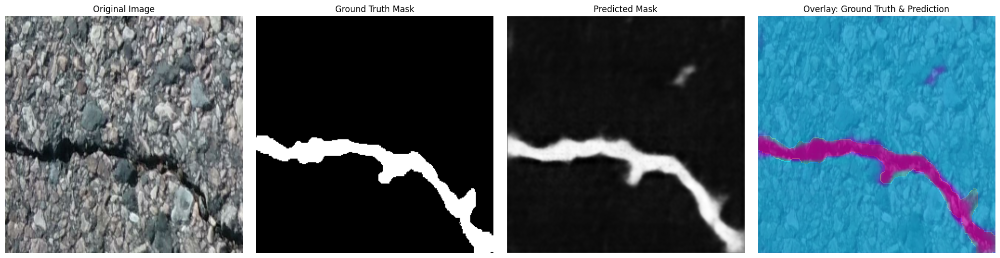

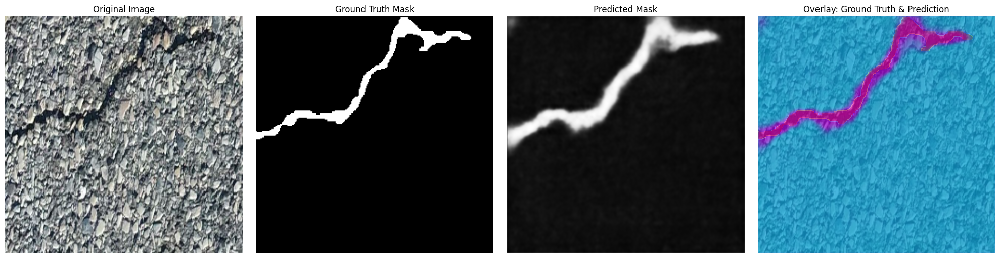

In [ ]:
# Additional analysis and visualization
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, jaccard_score

def calculate_statistics(model, dataset, threshold=0.5):
    """Calculate performance metrics for the test dataset."""
    y_true = []
    y_pred = []

    for images, labels in dataset:
        predictions = model.predict(images)
        main_predictions = predictions[0]  # Main output predictions

        for idx in range(len(images)):
            true_mask = labels['main_output'][idx, ..., 0].numpy().flatten()
            pred_mask = (main_predictions[idx, ..., 0] > threshold).flatten()  # Already a NumPy array

            y_true.extend(true_mask)
            y_pred.extend(pred_mask)

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Metrics
    iou = jaccard_score(y_true, y_pred, average='binary')
    report = classification_report(y_true, y_pred, output_dict=True)
    confusion = confusion_matrix(y_true, y_pred)

    return iou, report, confusion


def plot_confusion_matrix(conf_matrix, class_names):
    """Plot a confusion matrix."""
    plt.figure(figsize=(8, 6))
    plt.imshow(conf_matrix, interpolation='nearest', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    thresh = conf_matrix.max() / 2
    for i, j in np.ndindex(conf_matrix.shape):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Calculate metrics
print("\nCalculating detailed statistics...")
iou_score, report, conf_matrix = calculate_statistics(model, test_dataset)

# Display metrics
print(f"\nJaccard Index (IoU): {iou_score:.4f}")
report_df = pd.DataFrame(report).transpose()
print("\nClassification Report:")
print(report_df)

# Save classification report
report_df.to_csv('classification_report.csv', index=True)
print("\nClassification report saved as 'classification_report.csv'")

# Plot confusion matrix
print("\nPlotting confusion matrix...")
plot_confusion_matrix(conf_matrix, class_names=['Background', 'Crack'])

# Visualize predictions with additional metrics
print("\nVisualizing predictions with additional metrics...")
for images, labels in test_dataset.take(1):
    predictions = model.predict(images)
    main_predictions = predictions[0]

    for idx in range(3):  # Display 3 samples
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))

        # Original image
        axes[0].imshow(images[idx])
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        # Ground truth
        axes[1].imshow(labels['main_output'][idx, ..., 0], cmap='gray')
        axes[1].set_title('Ground Truth Mask')
        axes[1].axis('off')

        # Predicted mask
        pred_mask = main_predictions[idx, ..., 0]
        axes[2].imshow(pred_mask, cmap='gray')
        axes[2].set_title('Predicted Mask')
        axes[2].axis('off')

        # Overlay ground truth and prediction
        axes[3].imshow(images[idx])
        axes[3].imshow(labels['main_output'][idx, ..., 0], alpha=0.5, cmap='jet')
        axes[3].imshow(pred_mask, alpha=0.5, cmap='cool')
        axes[3].set_title('Overlay: Ground Truth & Prediction')
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()
